# Decoding random things

In [1]:
%load_ext autoreload
%autoreload 2

import sys

sys.path.append("../../")

import pyaldata as pyal
import numpy as np
import matplotlib.pyplot as plt

import tools.dataTools as dt
import tools.decoding as decode
import tools.viz.utilityTools as vizutils

from scipy.signal import find_peaks
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import cross_val_score, KFold
from sklearn.metrics import r2_score
from tqdm import tqdm


## Decoding intertrials

In [208]:
handler = decode.DecodingDataHandler(
    data_dir='/data/bnd-data/raw/', 
    session='M063_2025_03_14_15_30'
)

field values_before_camera_trigger could not be converted to int.
field idx_before_camera_trigger could not be converted to int.
array field VAL_KSLabel could not be converted to int.
array field SSp_KSLabel could not be converted to int.
array field all_KSLabel could not be converted to int.
array field CP_KSLabel could not be converted to int.
array field MOp_KSLabel could not be converted to int.
field idx_motion could not be converted to int.
field values_Sol_direction could not be converted to int.
field idx_Sol_direction could not be converted to int.
field values_Sol_duration could not be converted to int.
field idx_Sol_duration could not be converted to int.
field idx_sol_on could not be converted to int.
array field VAL_KSLabel could not be converted to int.
array field SSp_KSLabel could not be converted to int.
array field all_KSLabel could not be converted to int.
array field CP_KSLabel could not be converted to int.
array field MOp_KSLabel could not be converted to int.
fie

/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: values_MotSen1_X might be a time-varying field. It matches the length of VAL_spikes on 99.85228951255539% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: idx_MotSen1_X might be a time-varying field. It matches the length of VAL_spikes on 99.85228951255539% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: values_MotSen1_Y might be a time-varying field. It matches the length of VAL_spikes on 99.85228951255539% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: idx_MotSen1_Y might be a time-varying field. It matches the length of VAL_spikes on 99.85228951255539% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/

Combined every 3 bins
Resulting VAL_spikes ephys data shape is (NxT): (260, 20000)
Resulting SSp_spikes ephys data shape is (NxT): (92, 20000)
Resulting all_spikes ephys data shape is (NxT): (38, 20000)
Resulting CP_spikes ephys data shape is (NxT): (329, 20000)
Resulting MOp_spikes ephys data shape is (NxT): (161, 20000)


In [118]:
np.unique(df_trials['inter_dur'].values)

array([100, 300, 500], dtype=int32)

In [209]:
df_intertrials = pyal.select_trials(handler.df, handler.df.trial_name == 'intertrial')
df_trials = pyal.select_trials(handler.df, handler.df.trial_name == 'trial')
inter_durs = df_intertrials['trial_length'].values
df_trials['inter_dur'] = inter_durs[:-1]

# df_trials = df_trials[df_trials['inter_dur'] != 301]
handler.df = df_trials

In [210]:
data = handler.get_data_and_kinematics(area='MOp', condition='trial', trial_cat='inter_dur')

Number of trials per condition: 97


In [211]:
labels = np.repeat(np.unique(handler.df['inter_dur']), 97)

In [170]:
data_reshaped = data.reshape(-1, data.shape[1]*data.shape[2])
data_reshaped.shape

(153, 2680)

In [147]:
from sklearn.model_selection import cross_val_score
from sklearn.naive_bayes import GaussianNB


cross_val_score(GaussianNB(), data_reshaped, labels, scoring="accuracy", cv=5).mean()


0.3064367816091954

In [108]:
data_reshaped.shape

(4, 680)

In [190]:
from contextlib import contextmanager

from matplotlib import pyplot as plt
import seaborn as sns


@contextmanager
def apply_plot_style(context : str = 'talk'):
    with plt.style.context('seaborn-v0_8-bright'):
        sns.set_theme(context=context, style='ticks')
        
        yield  # This allows you to plot within the context
        sns.despine(offset=10, trim=True)

In [192]:
y_pred

array([500, 500, 500, 500, 500, 500, 100, 100, 500, 500, 500, 300, 300,
       300, 500, 300, 500, 500, 500, 500, 500, 500, 100, 300, 100, 100,
       100, 100, 300, 300, 500, 300, 300, 300, 300, 300, 300, 300, 300,
       100, 100, 100, 100, 500, 300, 300, 300, 300, 300, 500, 100, 100,
       100, 100, 500, 300, 500, 300, 300, 100, 500, 300, 300, 300, 100,
       100, 300, 300, 300, 100, 100, 100, 100, 100, 100, 300, 500, 300,
       500, 500, 100, 100, 100, 100, 500, 300, 300, 300, 300, 100, 500,
       100, 300, 500, 100, 500, 500, 500, 500, 300, 100, 100, 300, 500,
       500, 500, 500, 500, 300, 500, 500, 500, 500, 500, 500, 500, 100,
       500, 300, 500, 500, 500, 300, 500, 500, 500, 500, 500, 500, 500,
       300, 300, 100, 300, 100, 100, 300, 300, 100, 300, 500, 100, 500,
       300, 100, 500, 100, 100, 300, 100, 300, 300, 300, 300, 100, 300,
       300, 100, 100, 300, 100, 100, 500, 100, 300, 100, 300, 300, 300,
       500, 100, 300, 300, 100, 300, 100, 300, 100, 100, 500, 50

In [194]:
labels

array(['100', '100', '100', '100', '100', '100', '100', '100', '100',
       '100', '100', '100', '100', '100', '100', '100', '100', '100',
       '100', '100', '100', '100', '100', '100', '100', '100', '100',
       '100', '100', '100', '100', '100', '100', '100', '100', '100',
       '100', '100', '100', '100', '100', '100', '100', '100', '100',
       '100', '100', '100', '100', '100', '100', '100', '100', '100',
       '100', '100', '100', '100', '100', '100', '100', '100', '100',
       '100', '100', '100', '100', '100', '100', '100', '100', '100',
       '100', '100', '100', '100', '100', '100', '100', '100', '100',
       '100', '100', '100', '100', '100', '100', '100', '100', '100',
       '100', '100', '100', '100', '100', '100', '100', '100', '100',
       '100', '100', '100', '100', '100', '100', '100', '100', '100',
       '100', '300', '300', '300', '300', '300', '300', '300', '300',
       '300', '300', '300', '300', '300', '300', '300', '300', '300',
       '300', '300',

Number of trials per condition: 97
Area MOp score: 0.3298655756867329
Number of trials per condition: 97
Area CP score: 0.3024547048509644
Number of trials per condition: 97
Area SSp score: 0.37445938047925187
Number of trials per condition: 97
Area VAL score: 0.2885447106954997


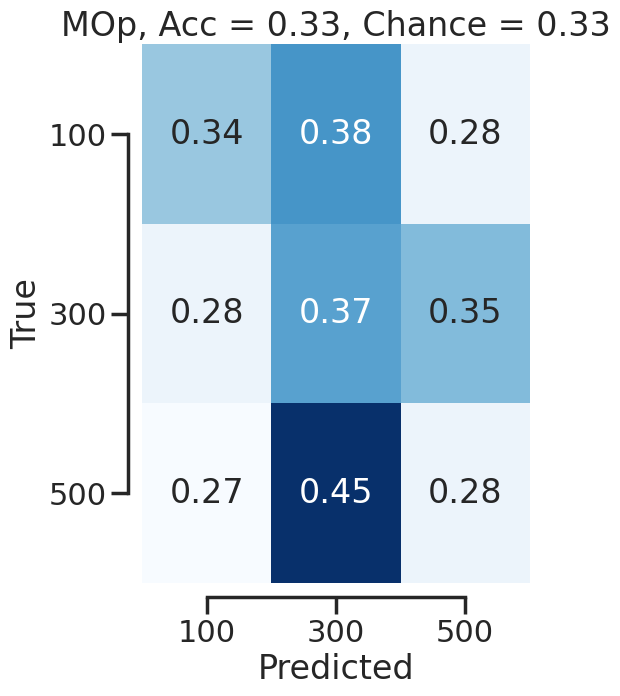

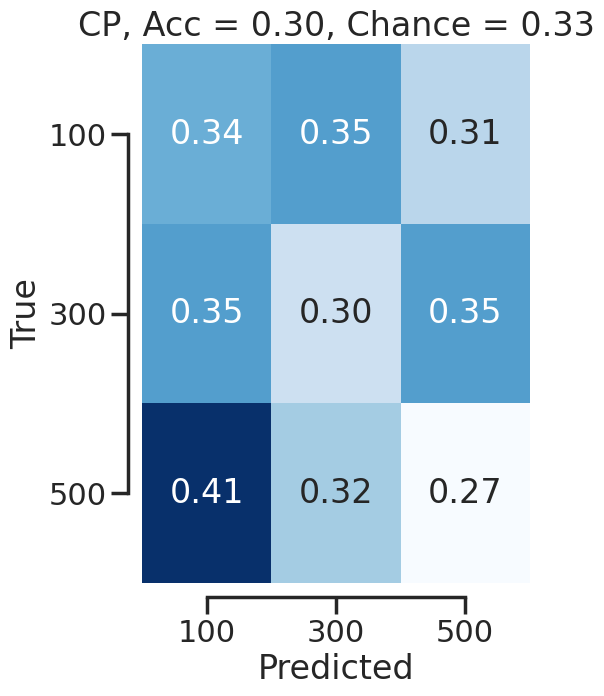

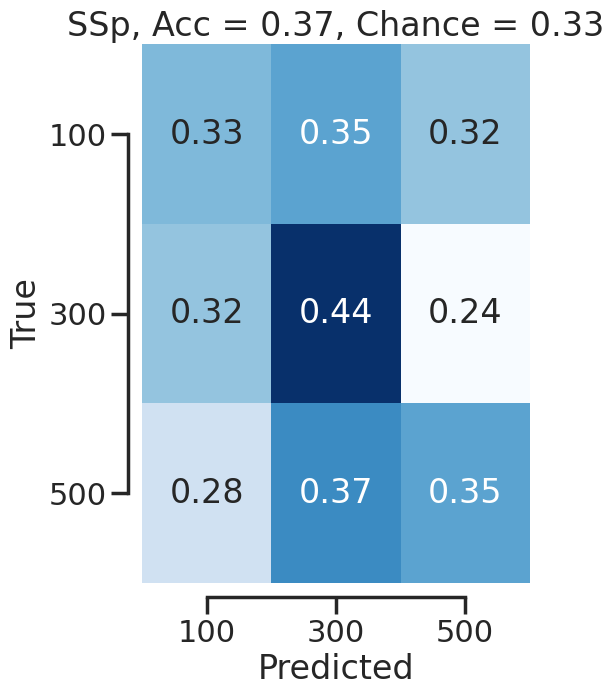

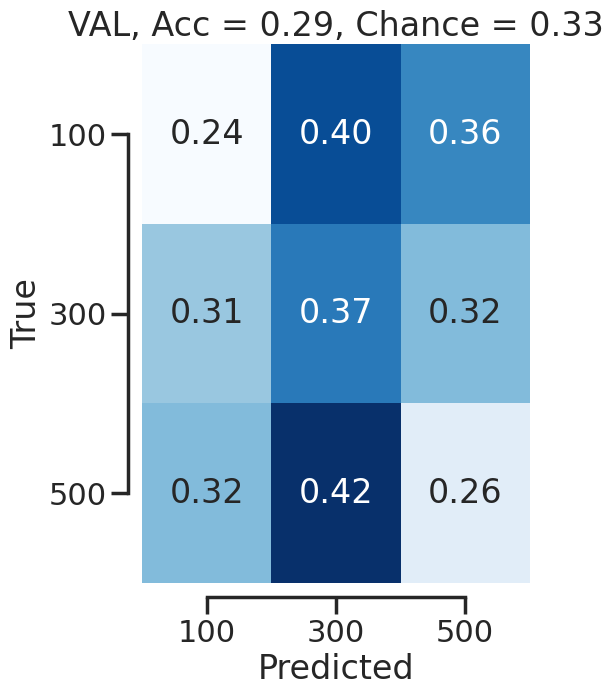

In [212]:
# Loop areas
from sklearn.calibration import cross_val_predict
from sklearn.metrics import confusion_matrix

for area in ['MOp', 'CP', 'SSp', 'VAL']:
    data = handler.get_data_and_kinematics(
        area=area, condition='trial', trial_cat='inter_dur', epoch=(0, 0.5)
    )
    data_reshaped = data.reshape(-1, data.shape[1]*data.shape[2])
    y_pred = cross_val_predict(GaussianNB(), data_reshaped, labels, cv=5)
    score = cross_val_score(GaussianNB(), data_reshaped, labels, scoring="accuracy", cv=5).mean()

    conf_mat = confusion_matrix(labels, y_pred)
    conf_mat_normalized = conf_mat.astype('float') / conf_mat.sum(axis=1)[:, np.newaxis]

    print(f'Area {area} score: {score}')

    with apply_plot_style('poster'):
        fig, ax = plt.subplots(figsize=(5,7))
        sns.heatmap(
            conf_mat_normalized,
            annot=True,
            fmt=".2f",
            cmap="Blues",
            ax=ax,
            cbar=False
        )
        ax.set_xlabel("Predicted")
        ax.set_ylabel("True")
        # Change the tick labels
        new_ticks = ['100', '300', '500']

        # Set the new tick labels for x and y axes
        ax.set_xticklabels(new_ticks, rotation=45)  # Rotate x-tick labels if needed
        ax.set_yticklabels(new_ticks, rotation=0)   # Rotate y-tick labels if needed
        ax.set_title(
                f"{area}, Acc = {score:.2f}, Chance = {1/3:.2f}"
            )
plt.show()

In [214]:
# Loop areas
from sklearn.calibration import cross_val_predict
from sklearn.metrics import confusion_matrix

scores = []
scores_control = []
for area in ['MOp', 'CP', 'SSp', 'VAL']:
    data = handler.get_data_and_kinematics(
        area=area, condition='trial', trial_cat='inter_dur', epoch=(0, 0.5)
    )
    data_reshaped = data.reshape(-1, data.shape[1]*data.shape[2])
    y_pred = cross_val_predict(GaussianNB(), data_reshaped, labels, cv=5)
    score = cross_val_score(GaussianNB(), data_reshaped, labels, scoring="accuracy", cv=5)

    scores.append(score)

    data = handler.get_data_and_kinematics(
        area=area, condition='trial', trial_cat='inter_dur', epoch=(-0.6, -0.1)
    )
    data_reshaped = data.reshape(-1, data.shape[1]*data.shape[2])
    y_pred = cross_val_predict(GaussianNB(), data_reshaped, labels, cv=5)
    score = cross_val_score(GaussianNB(), data_reshaped, labels, scoring="accuracy", cv=5)

    scores_control.append(score)




Number of trials per condition: 97
Number of trials per condition: 97
Number of trials per condition: 97
Number of trials per condition: 97
Number of trials per condition: 97
Number of trials per condition: 97
Number of trials per condition: 97
Number of trials per condition: 97


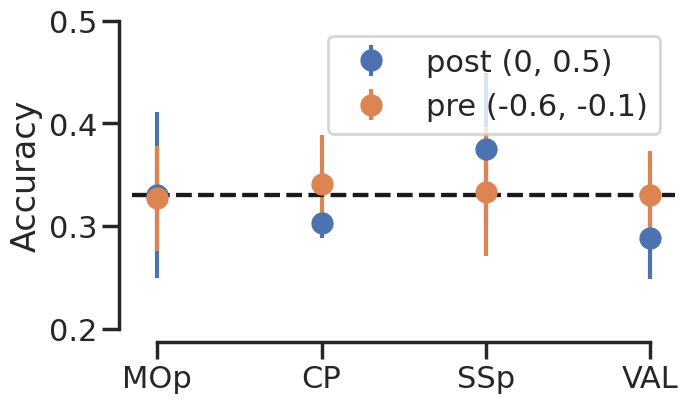

In [215]:
with apply_plot_style('poster'):
    fig, ax = plt.subplots(figsize=(7,  4), sharey='all')
    ax.errorbar(x=['MOp', 'CP', 'SSp', 'VAL'], y=np.mean(scores, axis=1), yerr=np.std(scores, axis=1), fmt='o',
                    markersize=15, label='post (0, 0.5)')
    ax.set_ylim([0, 1])
    ax.set_ylabel('Accuracy')
    ax.axhline(y=0.33, color='k', linestyle='dashed')

    ax.errorbar(x=['MOp', 'CP', 'SSp', 'VAL'], y=np.mean(scores_control, axis=1), yerr=np.std(scores_control, axis=1), fmt='o',
                    markersize=15, label='pre (-0.6, -0.1)')
    ax.set_ylim([0.2, 0.5])
    ax.set_ylabel('Accuracy')
    ax.axhline(y=0.33, color='k', linestyle='dashed')
    ax.legend()

plt.show()

## Check kinematic cycles

In [ ]:
handler = decode.DecodingDataHandler(
    data_dir='/data/bnd-data/raw/', 
    session='M062_2025_03_20_14_00'
)

field values_before_camera_trigger could not be converted to int.
field idx_before_camera_trigger could not be converted to int.
array field all_KSLabel could not be converted to int.
array field SSp_KSLabel could not be converted to int.
array field VAL_KSLabel could not be converted to int.
array field CP_KSLabel could not be converted to int.
array field MOp_KSLabel could not be converted to int.
field values_Sol_direction could not be converted to int.
field idx_Sol_direction could not be converted to int.
field values_Sol_duration could not be converted to int.
field idx_Sol_duration could not be converted to int.
field idx_sol_on could not be converted to int.
array field all_KSLabel could not be converted to int.
array field SSp_KSLabel could not be converted to int.
array field VAL_KSLabel could not be converted to int.
array field CP_KSLabel could not be converted to int.
array field MOp_KSLabel could not be converted to int.
field values_Sol_direction could not be converted t

/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: values_MotSen1_X might be a time-varying field. It matches the length of all_spikes on 99.85875706214689% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: idx_MotSen1_X might be a time-varying field. It matches the length of all_spikes on 99.85875706214689% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: values_MotSen1_Y might be a time-varying field. It matches the length of all_spikes on 99.85875706214689% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: idx_MotSen1_Y might be a time-varying field. It matches the length of all_spikes on 99.85875706214689% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/

Resulting all_spikes ephys data shape is (NxT): (23, 48000)
Resulting SSp_spikes ephys data shape is (NxT): (66, 48000)
Resulting VAL_spikes ephys data shape is (NxT): (122, 48000)
Resulting CP_spikes ephys data shape is (NxT): (280, 48000)
Resulting MOp_spikes ephys data shape is (NxT): (179, 48000)


In [26]:
_, kinematics = handler.get_data_and_kinematics(kinematics=['right_knee', 'right_ankle'])

In [77]:
0 % 3

0

0 0
1 0
2 0
0 1
1 1
2 1


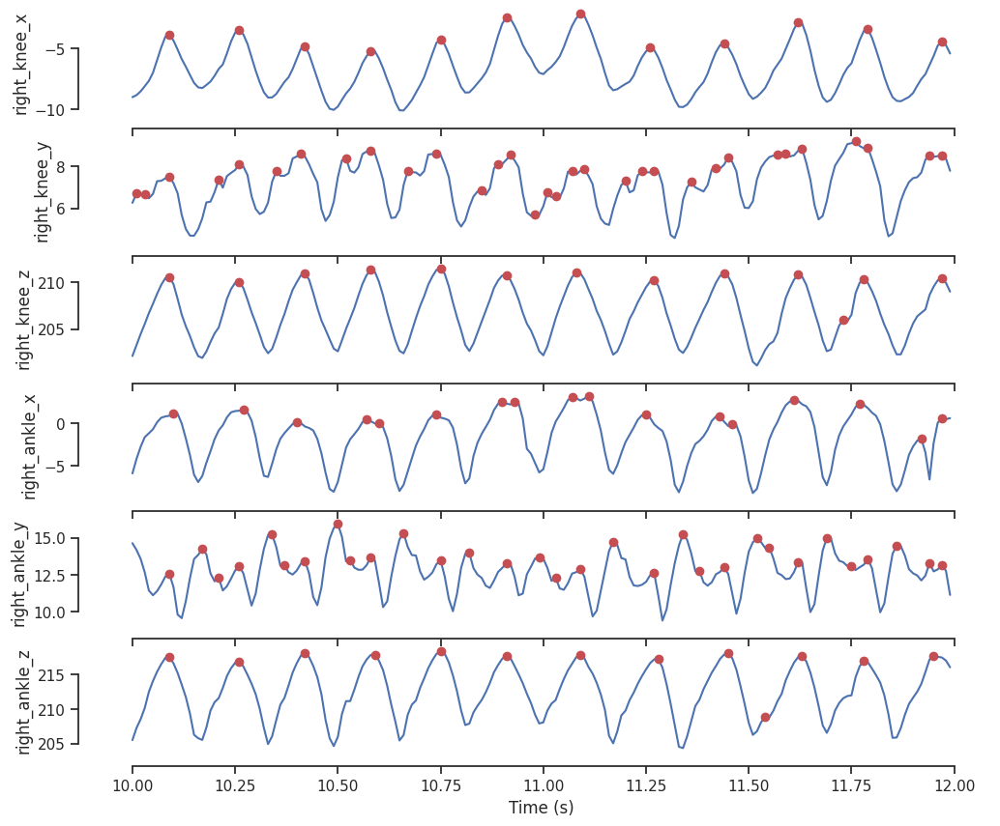

In [95]:
kin_labels=['right_knee', 'right_ankle']
dims = ['x', 'y', 'z']
times = np.arange(1000, 1200)
from scipy.signal import find_peaks

with vizutils.apply_plot_style('notebook'):
    fig, axes = plt.subplots(kinematics.shape[1], 1, figsize=(12, 10), sharex='all')
    label_counter = 0
    dim_counter = 0
    for idx, (kin, ax) in enumerate(zip(kinematics.T, axes)):
        if (idx % 3 == 0) and (idx != 0): 
            label_counter += 1
            dim_counter = 0
        
        print(dim_counter, label_counter)
        signal = kin[times]
        peaks, _ = find_peaks(signal)
        ax.set_ylabel(f'{kin_labels[label_counter]}_{dims[dim_counter]}')
        ax.plot(times*0.01, signal)
        ax.plot(times[peaks]*0.01, signal[peaks], 'ro', label='Peaks')
        dim_counter += 1
    ax.set_xlabel('Time (s)')
        

In [ ]:
# handler.df = handler.df.iloc[:-2]

In [178]:

_, kinematics = handler.get_data_and_kinematics(
    condition='trial', 
    kinematics=['right_knee'], 
    trial_cat='values_Sol_direction', 
    epoch=(-2, 3.5)
)


/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:27: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [706]
  df = pyal.restrict_to_interval(df, epoch_fun=epoch)
/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:18: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [706]
  df = pyal.restrict_to_interval(df, epoch_fun=epoch)
/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:147: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [706]
  df_ = pyal.restrict_to_interval(df, epoch_fun=epoch) if epoch is not None else df


Number of trials per condition: 21


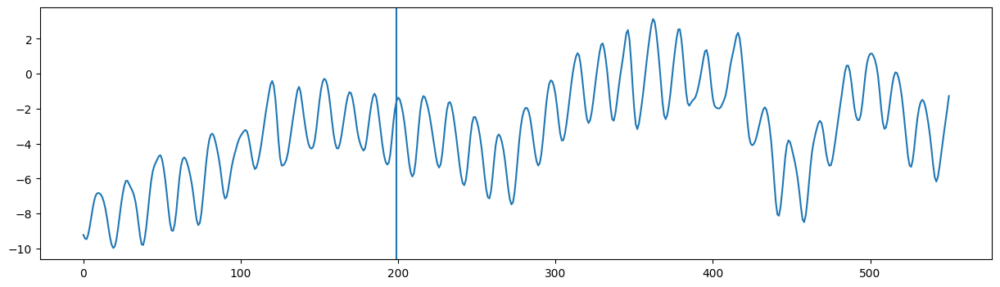

In [191]:
plt.figure(figsize=(15, 4))
plt.plot(kinematics[180, :, 0])
plt.axvline(x=199)

In [ ]:
targets = np.repeate()

In [195]:
perturbation_index = 199
signal = kinematics[180, :, 0]
signal_pre = signal[:perturbation_index]

# Find peaks
peaks, _ = find_peaks(signal_pre)

# Compute distances between consecutive peaks
peak_distances = np.diff(peaks)
peak_distances

array([19, 21, 15, 18, 21, 17, 17, 16, 16, 16])

In [196]:
mean_cycle_dur = np.mean(peak_distances) * 0.01

In [197]:
((perturbation_index - peaks[-1])*0.01) / mean_cycle_dur

0.7954545454545454

In [ ]:
targets = np.repeat(np.unique(handler.df['values_Sol_direction']), 21)

In [209]:
trials_df = pyal.select_trials(handler.df, handler.df.trial_name == 'trial')
targets = np.repeat(np.unique(trials_df['values_Sol_direction'].values.astype(int)), 21)
targets.shape

(252,)

In [16]:
def classify_perturbation_on_gait_cycle(kinematics, perturbation_index=199):
    gait_cycle_perturb = []
    for trial in kinematics:
        # print(trial.shape)
        signal_pre = trial[:perturbation_index, 0]
        peaks, _ = find_peaks(signal_pre)

        # Compute distances between consecutive peaks
        peak_distances = np.diff(peaks)

        mean_cycle_dur = np.mean(peak_distances) * 0.01

        timing = ((perturbation_index - peaks[-1])*0.01) / mean_cycle_dur
        gait_cycle_perturb.append(timing)
    return np.array(gait_cycle_perturb)

# timings = classify_perturbation_on_gait_cycle(kinematics)

In [284]:
perturbations_first_half = np.where(timings <= 0.25)
perturbations_second_half = np.where(timings <= 0.5)

In [279]:
kinematics_first_half, targets_first_half = kinematics[perturbations_first_half], targets[perturbations_first_half]
kinematics_second_half, targets_second_half = kinematics[perturbations_second_half], targets[perturbations_second_half]

In [275]:
kinematics_second_half.shape

(102, 391, 6)

In [285]:
_, kinematics = handler.get_data_and_kinematics(
    condition='trial', 
    kinematics=['right_knee', 'left_knee'], 
    trial_cat='values_Sol_direction', 
    epoch=(0, 3.9)
)
kinematics_first_half, targets_first_half = kinematics[perturbations_first_half], targets[perturbations_first_half]
kinematics_second_half, targets_second_half = kinematics[perturbations_second_half], targets[perturbations_second_half]

kinematics_first_half_reshaped = kinematics_first_half.reshape(-1, kinematics_first_half.shape[1]*kinematics_first_half.shape[2])
kinematics_second_half_reshaped = kinematics_second_half.reshape(-1, kinematics_second_half.shape[1]*kinematics_second_half.shape[2])


/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:27: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [706]
  df = pyal.restrict_to_interval(df, epoch_fun=epoch)
/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:18: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [706]
  df = pyal.restrict_to_interval(df, epoch_fun=epoch)
/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:147: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [706]
  df_ = pyal.restrict_to_interval(df, epoch_fun=epoch) if epoch is not None else df


Number of trials per condition: 21


In [286]:
from sklearn.model_selection import cross_val_score
from sklearn.naive_bayes import GaussianNB


cross_val_score(GaussianNB(), kinematics_first_half_reshaped, targets_first_half, scoring="accuracy", cv=2).mean()

/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=2.
  warnings.warn(


0.13157894736842105

## Decode direction with time lock perturbations

In [69]:
handler1.df.columns

Index(['animal', 'session', 'trial_id', 'trial_name', 'trial_length',
       'bin_size', 'idx_trial_start', 'idx_trial_end', 'idx_CPI',
       'values_before_camera_trigger', 'idx_before_camera_trigger',
       'idx_motion', 'values_Sol_direction', 'idx_Sol_direction',
       'values_Sol_duration', 'idx_Sol_duration', 'idx_sol_on',
       'idx_earthquake_duration', 'idx_session_timer', 'values_MotSen1_X',
       'idx_MotSen1_X', 'values_MotSen1_Y', 'idx_MotSen1_Y', 'hip_center',
       'left_ankle', 'left_ankle_angle', 'left_elbow', 'left_elbow_angle',
       'left_foot', 'left_knee', 'left_knee_angle', 'left_paw',
       'left_shoulder', 'left_wrist', 'left_wrist_angle', 'right_ankle',
       'right_ankle_angle', 'right_elbow', 'right_elbow_angle', 'right_foot',
       'right_knee', 'right_knee_angle', 'right_paw', 'right_shoulder',
       'right_wrist', 'right_wrist_angle', 'shoulder_center', 'tail_base',
       'tail_middle', 'tail_tip', 'SSp_chan_best', 'SSp_unit_guide',
       'SS

In [70]:
kinematics_reshaped = []
targets_for_classifc = []

sessions = [
    # 'M046_2024_12_18_16_00'
    # 'M046_2024_12_19_13_30',
    # "M061_2025_03_04_10_00",
    # "M061_2025_03_05_14_00",
    # "M061_2025_03_06_14_00",
    # "M062_2025_03_19_14_00",
    "M062_2025_03_20_14_00",
    "M062_2025_03_21_14_00",
    # "M063_2025_03_12_14_00",
    # "M063_2025_03_13_14_00",
    # "M063_2025_03_14_15_30",
]

n_trials = [22, 21]
gait_interval = (0.25, 0.5)
kinematics_for_decoding = ['left_ankle', 'left_ankle_angle', 'left_elbow', 'left_elbow_angle',
       'left_foot', 'left_knee', 'left_knee_angle', 'left_paw',
       'left_shoulder', 'left_wrist', 'left_wrist_angle', 'right_ankle',
       'right_ankle_angle', 'right_elbow', 'right_elbow_angle', 'right_foot',
       'right_knee', 'right_knee_angle', 'right_paw', 'right_shoulder',
       'right_wrist', 'right_wrist_angle', 'shoulder_center', 'tail_base',
       'tail_middle', 'tail_tip']


for session, n_trial in zip(sessions, n_trials):
    handler = decode.DecodingDataHandler(
        data_dir='/data/bnd-data/raw/', 
        session=session
    )

    # Extract timings
    _, kinematics = handler.get_data_and_kinematics(
        condition='trial', 
        kinematics=['right_knee'], 
        trial_cat='values_Sol_direction', 
        epoch=(-2, 3.5),
    )
    trials_df = pyal.select_trials(handler.df, handler.df.trial_name == 'trial')
    targets = np.repeat(np.unique(trials_df['values_Sol_direction'].values.astype(int)), n_trial)


    timings = classify_perturbation_on_gait_cycle(kinematics)
    perturbations_idx = np.where(
        (timings >= gait_interval[0]) & (timings <= gait_interval[1])
    )[0]

    _, kinematics = handler.get_data_and_kinematics(
        condition='trial', 
        kinematics=kinematics_for_decoding, 
        trial_cat='values_Sol_direction', 
        epoch=(-1.9, -1.5)
    )

    kinematics_for_classific_, targets_for_classifc_ = kinematics[perturbations_idx], targets[perturbations_idx]
    kinematics_reshaped_ = kinematics_for_classific_.reshape(-1, kinematics_for_classific_.shape[1]*kinematics_for_classific_.shape[2])
    
    kinematics_reshaped.append(kinematics_reshaped_)
    targets_for_classifc.append(targets_for_classifc_)

arr_data = np.concatenate(kinematics_reshaped)
arr_labels = np.concatenate(targets_for_classifc)

field values_before_camera_trigger could not be converted to int.
field idx_before_camera_trigger could not be converted to int.
array field SSp_KSLabel could not be converted to int.
array field VAL_KSLabel could not be converted to int.
array field all_KSLabel could not be converted to int.
array field CP_KSLabel could not be converted to int.
array field MOp_KSLabel could not be converted to int.
field values_Sol_direction could not be converted to int.
field idx_Sol_direction could not be converted to int.
field values_Sol_duration could not be converted to int.
field idx_Sol_duration could not be converted to int.
field idx_sol_on could not be converted to int.
array field SSp_KSLabel could not be converted to int.
array field VAL_KSLabel could not be converted to int.
array field all_KSLabel could not be converted to int.
array field CP_KSLabel could not be converted to int.
array field MOp_KSLabel could not be converted to int.
array field SSp_KSLabel could not be converted to i

/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: values_MotSen1_X might be a time-varying field. It matches the length of SSp_spikes on 99.85955056179775% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: idx_MotSen1_X might be a time-varying field. It matches the length of SSp_spikes on 99.85955056179775% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: values_MotSen1_Y might be a time-varying field. It matches the length of SSp_spikes on 99.85955056179775% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: idx_MotSen1_Y might be a time-varying field. It matches the length of SSp_spikes on 99.85955056179775% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/

Resulting SSp_spikes ephys data shape is (NxT): (118, 48000)
Resulting VAL_spikes ephys data shape is (NxT): (155, 48000)
Resulting all_spikes ephys data shape is (NxT): (34, 48000)
Resulting CP_spikes ephys data shape is (NxT): (356, 48000)
Resulting MOp_spikes ephys data shape is (NxT): (163, 48000)


/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:27: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [710]
  df = pyal.restrict_to_interval(df, epoch_fun=epoch)
/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:18: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [710]
  df = pyal.restrict_to_interval(df, epoch_fun=epoch)
/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:147: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [710]
  df_ = pyal.restrict_to_interval(df, epoch_fun=epoch) if epoch is not None else df


KeyboardInterrupt: 

In [406]:
perturbations_idx

array([  0,  10,  13,  21,  22,  23,  29,  31,  34,  45,  54,  55,  57,
        73,  82,  90,  92,  93,  95,  98, 106, 107, 112, 114, 115, 117,
       123, 125, 127, 128, 130, 135, 137, 141, 143, 148, 151, 153, 155,
       160, 169, 174, 176, 185, 186, 190, 194, 196, 198, 202, 205, 207,
       209, 211, 212, 226, 230, 231, 232, 234, 236, 237, 243, 246, 247])

In [444]:
score = cross_val_score(GaussianNB(), arr_data, arr_labels, scoring="accuracy", cv=3).mean()
score

0.09747474747474748

In [343]:
n_trials = 21
gait_interval = (0, 0.4)
kinematics_for_decoding = ['right_knee', 'left_knee']

# Extract timings
_, kinematics = handler.get_data_and_kinematics(
    condition='trial', 
    kinematics=['right_knee'], 
    trial_cat='values_Sol_direction', 
    epoch=(-2, 3.5),
)
trials_df = pyal.select_trials(handler.df, handler.df.trial_name == 'trial')
targets = np.repeat(np.unique(trials_df['values_Sol_direction'].values.astype(int)), 21)


timings = classify_perturbation_on_gait_cycle(kinematics)
perturbations_idx = np.where(
    (timings >= gait_interval[0]) & (timings <= gait_interval[1])
)

_, kinematics = handler.get_data_and_kinematics(
    condition='trial', 
    kinematics=kinematics_for_decoding, 
    trial_cat='values_Sol_direction', 
    epoch=(0, 3.9)
)

kinematics_for_classific_, targets_for_classifc_ = kinematics[perturbations_idx], targets[perturbations_idx]
kinematics_reshaped_ = kinematics_for_classific_.reshape(-1, kinematics_for_classific_.shape[1]*kinematics_for_classific_.shape[2])
# kinematics_reshaped.append(kinematics_reshaped_)
# targets_for_classifc.append(targets_for_classifc_)


score = cross_val_score(GaussianNB(), kinematics_reshaped_, targets_for_classifc_, scoring="accuracy", cv=2).mean()


/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:27: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [706]
  df = pyal.restrict_to_interval(df, epoch_fun=epoch)
/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:18: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [706]
  df = pyal.restrict_to_interval(df, epoch_fun=epoch)
/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:147: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [706]
  df_ = pyal.restrict_to_interval(df, epoch_fun=epoch) if epoch is not None else df


Number of trials per condition: 21


/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:27: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [706]
  df = pyal.restrict_to_interval(df, epoch_fun=epoch)
/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:18: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [706]
  df = pyal.restrict_to_interval(df, epoch_fun=epoch)
/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:147: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [706]
  df_ = pyal.restrict_to_interval(df, epoch_fun=epoch) if epoch is not None else df


Number of trials per condition: 21


In [344]:
score

0.09210526315789473

__Some results__

Epoch: (-2, -0.1). Accuracy: 9%

Epoch: (-0.6, -0.1). Accuracy: 9%

Epoch: (0 to 3.9). Accuracy: 14%

Eopoch: (0 to 0.5). Accuracy: 11%

Epoch: (0.5 to 1). Accuracy: 4%

Epoch: (1.5 to 2). Accuracy: 8%

Epoch: (2.5, 3). Accuracy: 14%

Epoch: (3, 3.5). Accuracy: 11%

Epoch: (3.5, 4). Accuracy: 14%



In [316]:
score

0.09210526315789473

In [319]:
handler.df.columns

Index(['animal', 'session', 'trial_id', 'trial_name', 'trial_length',
       'bin_size', 'idx_trial_start', 'idx_trial_end', 'idx_CPI',
       'values_before_camera_trigger', 'idx_before_camera_trigger',
       'idx_motion', 'values_Sol_direction', 'idx_Sol_direction',
       'values_Sol_duration', 'idx_Sol_duration', 'idx_sol_on',
       'idx_earthquake_duration', 'idx_session_timer', 'values_MotSen1_X',
       'idx_MotSen1_X', 'values_MotSen1_Y', 'idx_MotSen1_Y', 'VAL_chan_best',
       'VAL_unit_guide', 'VAL_KSLabel', 'VAL_spikes', 'SSp_chan_best',
       'SSp_unit_guide', 'SSp_KSLabel', 'SSp_spikes', 'all_chan_best',
       'all_unit_guide', 'all_KSLabel', 'all_spikes', 'MOp_chan_best',
       'MOp_unit_guide', 'MOp_KSLabel', 'MOp_spikes', 'CP_chan_best',
       'CP_unit_guide', 'CP_KSLabel', 'CP_spikes', 'VAL_rates', 'SSp_rates',
       'all_rates', 'MOp_rates', 'CP_rates', 'sol_level_id',
       'sol_contra_ipsi'],
      dtype='object')

### Moving window

In [50]:
kinematics_for_classific = []
targets_for_classifc = []

sessions = [
    # 'M046_2024_12_18_16_00'
    # 'M046_2024_12_19_13_30',
    # "M061_2025_03_04_10_00",
    # "M061_2025_03_05_14_00",
    # "M061_2025_03_06_14_00",
    # "M062_2025_03_19_14_00",
    "M062_2025_03_20_14_00",
    "M062_2025_03_21_14_00",
    # "M063_2025_03_12_14_00",
    # "M063_2025_03_13_14_00",
    # "M063_2025_03_14_15_30",
]

n_trials = [22, 21]
gait_interval = (0.33, 66)
kinematics_for_decoding = ['left_ankle', 'left_ankle_angle', 'left_elbow', 'left_elbow_angle',
       'left_foot', 'left_knee', 'left_knee_angle', 'left_paw',
       'left_shoulder', 'left_wrist', 'left_wrist_angle', 'right_ankle',
       'right_ankle_angle', 'right_elbow', 'right_elbow_angle', 'right_foot',
       'right_knee', 'right_knee_angle', 'right_paw', 'right_shoulder',
       'right_wrist', 'right_wrist_angle', 'shoulder_center', 'tail_base',
       'tail_middle', 'tail_tip']


handler1 = decode.DecodingDataHandler(
            data_dir='/data/bnd-data/raw/', 
            session='M062_2025_03_20_14_00'
            )

handler2 = decode.DecodingDataHandler(
            data_dir='/data/bnd-data/raw/', 
            session='M062_2025_03_21_14_00'
            )



perturbations_idx = []
for handler, n_trial in zip([handler1, handler2], n_trials):
    # Extract timings
    _, kinematics, _ = handler.get_data_and_kinematics(
        condition='trial', 
        kinematics=kinematics_for_decoding, 
        trial_cat='values_Sol_direction', 
        epoch=(-2, 3.5),
    )
    # trials_df = pyal.select_trials(handler.df, handler.df.trial_name == 'trial')
    # targets = np.repeat(np.unique(trials_df['values_Sol_direction'].values.astype(int)), n_trial)


    timings = classify_perturbation_on_gait_cycle(kinematics)
    perturbations_idx_ = np.where(
        (timings >= gait_interval[0]) & (timings <= gait_interval[1])
    )[0]
    perturbations_idx.append(perturbations_idx_)




field values_before_camera_trigger could not be converted to int.
field idx_before_camera_trigger could not be converted to int.
array field SSp_KSLabel could not be converted to int.
array field VAL_KSLabel could not be converted to int.
array field all_KSLabel could not be converted to int.
array field CP_KSLabel could not be converted to int.
array field MOp_KSLabel could not be converted to int.
field values_Sol_direction could not be converted to int.
field idx_Sol_direction could not be converted to int.
field values_Sol_duration could not be converted to int.
field idx_Sol_duration could not be converted to int.
field idx_sol_on could not be converted to int.
array field SSp_KSLabel could not be converted to int.
array field VAL_KSLabel could not be converted to int.
array field all_KSLabel could not be converted to int.
array field CP_KSLabel could not be converted to int.
array field MOp_KSLabel could not be converted to int.
array field SSp_KSLabel could not be converted to i

/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: values_MotSen1_X might be a time-varying field. It matches the length of SSp_spikes on 99.85955056179775% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: idx_MotSen1_X might be a time-varying field. It matches the length of SSp_spikes on 99.85955056179775% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: values_MotSen1_Y might be a time-varying field. It matches the length of SSp_spikes on 99.85955056179775% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: idx_MotSen1_Y might be a time-varying field. It matches the length of SSp_spikes on 99.85955056179775% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/

Resulting SSp_spikes ephys data shape is (NxT): (118, 48000)
Resulting VAL_spikes ephys data shape is (NxT): (155, 48000)
Resulting all_spikes ephys data shape is (NxT): (34, 48000)
Resulting CP_spikes ephys data shape is (NxT): (356, 48000)
Resulting MOp_spikes ephys data shape is (NxT): (163, 48000)
field values_before_camera_trigger could not be converted to int.
field idx_before_camera_trigger could not be converted to int.
array field all_KSLabel could not be converted to int.
array field SSp_KSLabel could not be converted to int.
array field VAL_KSLabel could not be converted to int.
array field CP_KSLabel could not be converted to int.
array field MOp_KSLabel could not be converted to int.
field values_Sol_direction could not be converted to int.
field idx_Sol_direction could not be converted to int.
field values_Sol_duration could not be converted to int.
field idx_Sol_duration could not be converted to int.
field idx_sol_on could not be converted to int.
array field all_KSLabe

/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: values_MotSen1_X might be a time-varying field. It matches the length of all_spikes on 99.85875706214689% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: idx_MotSen1_X might be a time-varying field. It matches the length of all_spikes on 99.85875706214689% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: values_MotSen1_Y might be a time-varying field. It matches the length of all_spikes on 99.85875706214689% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: idx_MotSen1_Y might be a time-varying field. It matches the length of all_spikes on 99.85875706214689% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/

Resulting all_spikes ephys data shape is (NxT): (23, 48000)
Resulting SSp_spikes ephys data shape is (NxT): (66, 48000)
Resulting VAL_spikes ephys data shape is (NxT): (122, 48000)
Resulting CP_spikes ephys data shape is (NxT): (280, 48000)
Resulting MOp_spikes ephys data shape is (NxT): (179, 48000)


/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:27: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [710]
  df = pyal.restrict_to_interval(df, epoch_fun=epoch)
/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:18: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [710]
  df = pyal.restrict_to_interval(df, epoch_fun=epoch)
/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:147: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [710]
  df_ = pyal.restrict_to_interval(df, epoch_fun=epoch) if epoch is not None else df


Number of trials per condition: 22


/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:27: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [706]
  df = pyal.restrict_to_interval(df, epoch_fun=epoch)
/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:18: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [706]
  df = pyal.restrict_to_interval(df, epoch_fun=epoch)
/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:147: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [706]
  df_ = pyal.restrict_to_interval(df, epoch_fun=epoch) if epoch is not None else df


Number of trials per condition: 21


In [29]:
bin_size = 0.01

min_time_bin = int(-2 / bin_size)
max_time_bin= int(3 / bin_size)

window_length_bin = int(0.5 / bin_size)
step_bin = int(0.05 / bin_size)


time_points = np.arange(min_time_bin, max_time_bin-window_length_bin, step_bin)
# time_points
time_points

array([-200, -195, -190, -185, -180, -175, -170, -165, -160, -155, -150,
       -145, -140, -135, -130, -125, -120, -115, -110, -105, -100,  -95,
        -90,  -85,  -80,  -75,  -70,  -65,  -60,  -55,  -50,  -45,  -40,
        -35,  -30,  -25,  -20,  -15,  -10,   -5,    0,    5,   10,   15,
         20,   25,   30,   35,   40,   45,   50,   55,   60,   65,   70,
         75,   80,   85,   90,   95,  100,  105,  110,  115,  120,  125,
        130,  135,  140,  145,  150,  155,  160,  165,  170,  175,  180,
        185,  190,  195,  200,  205,  210,  215,  220,  225,  230,  235,
        240,  245])

In [42]:
kinematics_reshaped_.shape

(264, 3162)

In [49]:
arr_labels.shape

(131,)

In [ ]:
from sklearn.model_selection import cross_val_score
scores = []
control=False
for start_time in time_points[:1]:

    print(f'Processing window {start_time /  (1/bin_size)} -> {(start_time + window_length_bin) / (1/bin_size)}')

    kinematics_reshaped = []
    targets_for_classifc = []

    _, kinematics1, n_trials = handler1.get_data_and_kinematics(
        condition='trial', 
        kinematics=kinematics_for_decoding, 
        epoch=(start_time / (1/bin_size), (start_time + window_length_bin) / (1/bin_size)),
        # epoch = (0, 0.5)
    )

    trials_df = pyal.select_trials(handler1.df, handler1.df.trial_name == 'trial')
    targets = np.repeat(np.unique(trials_df['values_Sol_direction'].values.astype(int)), kinematics1.shape[0]/12)

    kinematics_for_classific_, targets_for_classifc_ = kinematics1[perturbations_idx[0]], targets[perturbations_idx[0]]
    kinematics_reshaped_ = kinematics_for_classific_.reshape(-1, kinematics_for_classific_.shape[1]*kinematics_for_classific_.shape[2])
    
    kinematics_reshaped.append(kinematics_reshaped_)
    targets_for_classifc.append(targets_for_classifc_)

    _, kinematics2, n_trials = handler2.get_data_and_kinematics(
        condition='trial', 
        kinematics=kinematics_for_decoding, 
        epoch=(start_time / (1/bin_size), (start_time + window_length_bin) / (1/bin_size)),
        # epoch = (0, 0.5)
    )

    trials_df = pyal.select_trials(handler2.df, handler2.df.trial_name == 'trial')
    targets = np.repeat(np.unique(trials_df['values_Sol_direction'].values.astype(int)), kinematics2.shape[0]/12)

    kinematics_for_classific_, targets_for_classifc_ = kinematics2[perturbations_idx[1]], targets[perturbations_idx[1]]
    kinematics_reshaped_ = kinematics_for_classific_.reshape(-1, kinematics_for_classific_.shape[1]*kinematics_for_classific_.shape[2])

    kinematics_reshaped.append(kinematics_reshaped_)
    targets_for_classifc.append(targets_for_classifc_)

    arr_data = np.concatenate(kinematics_reshaped)
    arr_labels = np.concatenate(targets_for_classifc)

    score = cross_val_score(GaussianNB(), arr_data, arr_labels, scoring="accuracy", cv=5)
    scores.append(score)

scores = np.array(scores)



Processing window -2.0 -> -1.5


/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:27: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [710]
  df = pyal.restrict_to_interval(df, epoch_fun=epoch)
/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:18: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [710]
  df = pyal.restrict_to_interval(df, epoch_fun=epoch)
/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:147: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [710]
  df_ = pyal.restrict_to_interval(df, epoch_fun=epoch) if epoch is not None else df


In [38]:
time_points

array([-200, -195, -190, -185, -180, -175, -170, -165, -160, -155, -150,
       -145, -140, -135, -130, -125, -120, -115, -110, -105, -100,  -95,
        -90,  -85,  -80,  -75,  -70,  -65,  -60,  -55,  -50,  -45,  -40,
        -35,  -30,  -25,  -20,  -15,  -10,   -5,    0,    5,   10,   15,
         20,   25,   30,   35,   40,   45,   50,   55,   60,   65,   70,
         75,   80,   85,   90,   95,  100,  105,  110,  115,  120,  125,
        130,  135,  140,  145,  150,  155,  160,  165,  170,  175,  180,
        185,  190,  195,  200,  205,  210,  215,  220,  225,  230,  235,
        240,  245])

Text(0.5, 1.0, 'Final third of gait cycle')

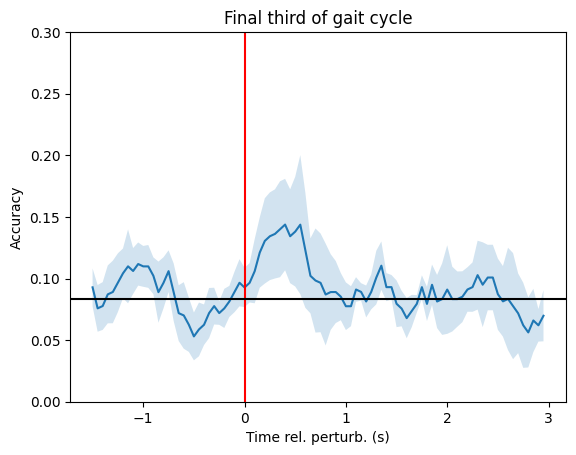

In [39]:
import scipy
fig, ax = plt.subplots()
vizutils.shaded_errorbar(ax, (time_points+50) /100, scores, errorStat=np.std)
ax.axvline(x=0, color='r')
ax.axhline(y=1/12, color='k')
ax.set_xlabel('Time rel. perturb. (s)')
ax.set_ylabel('Accuracy')
ax.set_ylim(0, 0.3)
ax.set_title('Final third of gait cycle')

Text(0.5, 1.0, 'First third of gait cycle')

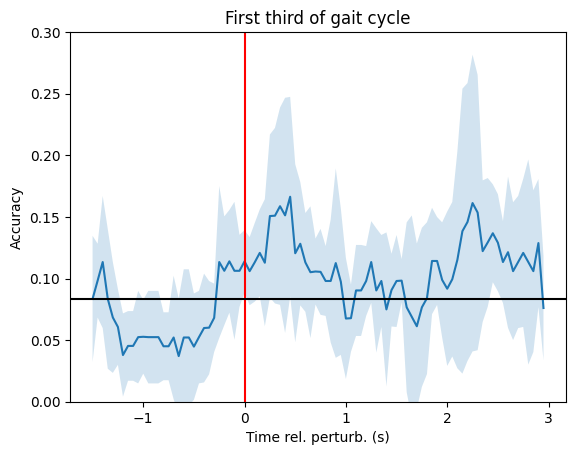

In [28]:
import scipy
fig, ax = plt.subplots()
vizutils.shaded_errorbar(ax, (time_points+50) /100, scores, errorStat=np.std)
ax.axvline(x=0, color='r')
ax.axhline(y=1/12, color='k')
ax.set_xlabel('Time rel. perturb. (s)')
ax.set_ylabel('Accuracy')
ax.set_ylim(0, 0.3)
ax.set_title('First third of gait cycle')


(0.0, 0.3)

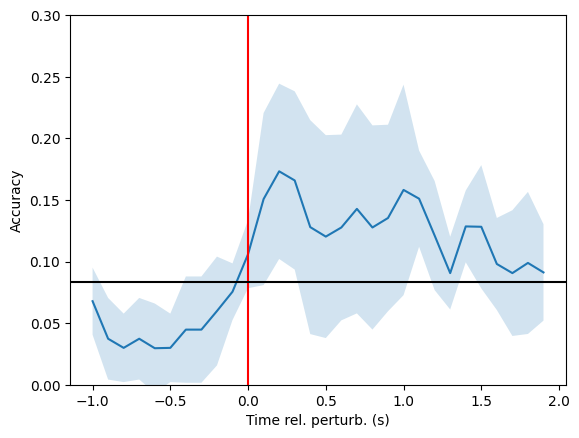

In [81]:
import scipy
fig, ax = plt.subplots()
vizutils.shaded_errorbar(ax, (time_points+100) /100, scores, errorStat=np.std)
ax.axvline(x=0, color='r')
ax.axhline(y=1/12, color='k')
ax.set_xlabel('Time rel. perturb. (s)')
ax.set_ylabel('Accuracy')
ax.set_ylim(0, 0.3)


Text(0, 0.5, 'Accuracy')

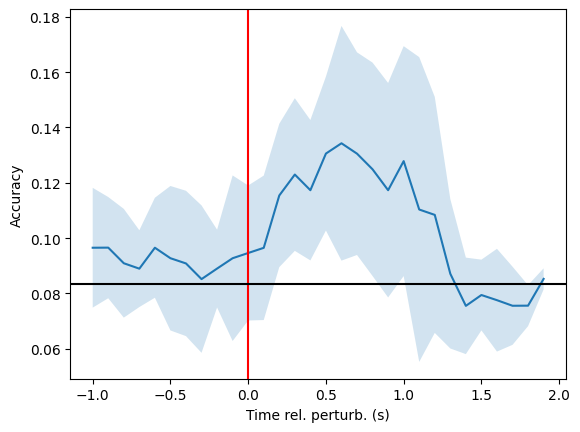

In [ ]:
import scipy
fig, ax = plt.subplots()
vizutils.shaded_errorbar(ax, (time_points+100) /100, scores, errorStat=np.std)
ax.axvline(x=0, color='r')
ax.axhline(y=1/12, color='k')
ax.set_xlabel('Time rel. perturb. (s)')
ax.set_ylabel('Accuracy')
ax.set_ylim(0, 0.3)


(0.0, 0.5)

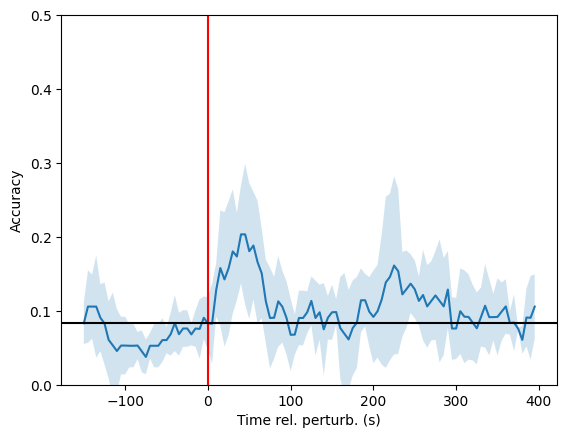

In [ ]:
import scipy
fig, ax = plt.subplots()
vizutils.shaded_errorbar(ax, (time_points+50) /100, scores1, errorStat=np.std)
ax.axvline(x=0, color='r')
ax.axhline(y=1/12, color='k')
ax.set_xlabel('Time rel. perturb. (s)')
ax.set_ylabel('Accuracy')
ax.set_ylim(0, 0.3)


In [30]:
scores2 = scores

Text(0, 0.5, 'Accuracy')

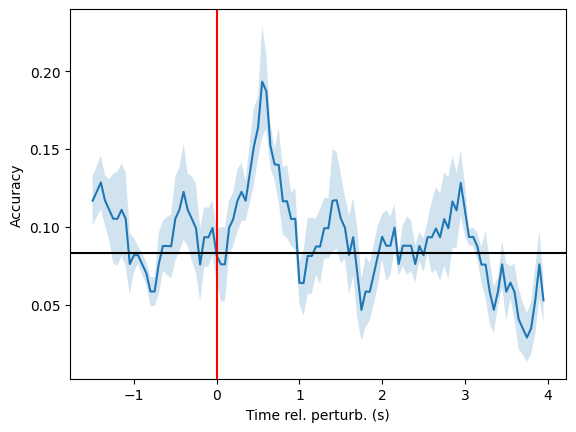

In [32]:
import scipy
fig, ax = plt.subplots()
vizutils.shaded_errorbar(ax, (time_points+50) /100, scores2, errorStat=scipy.stats.sem)
ax.axvline(x=0, color='r')
ax.axhline(y=1/12, color='k')
ax.set_xlabel('Time rel. perturb. (s)')
ax.set_ylabel('Accuracy')
# ax.set_ylim(0, 0.5)


### Loop and average phases

In [ ]:
len(perturbations_idx[0])


(264, 51, 62)

In [53]:
len(perturbations_idx[0]) + len(perturbations_idx[1])

384

In [ ]:
import random


kinematics_for_classific = []
targets_for_classifc = []

sessions = [
    # 'M046_2024_12_18_16_00'
    # 'M046_2024_12_19_13_30',
    # "M061_2025_03_04_10_00",
    # "M061_2025_03_05_14_00",
    # "M061_2025_03_06_14_00",
    # "M062_2025_03_19_14_00",
    "M062_2025_03_20_14_00",
    "M062_2025_03_21_14_00",
    # "M063_2025_03_12_14_00",
    # "M063_2025_03_13_14_00",
    # "M063_2025_03_14_15_30",
]

# Time points
bin_size = 0.01
min_time_bin = int(-2 / bin_size)
max_time_bin= int(3 / bin_size)
window_length_bin = int(0.5 / bin_size)
step_bin = int(0.05 / bin_size)
time_points = np.arange(min_time_bin, max_time_bin-window_length_bin, step_bin)

kinematics_for_decoding = ['left_ankle', 'left_ankle_angle', 'left_elbow', 'left_elbow_angle',
       'left_foot', 'left_knee', 'left_knee_angle', 'left_paw',
       'left_shoulder', 'left_wrist', 'left_wrist_angle', 'right_ankle',
       'right_ankle_angle', 'right_elbow', 'right_elbow_angle', 'right_foot',
       'right_knee', 'right_knee_angle', 'right_paw', 'right_shoulder',
       'right_wrist', 'right_wrist_angle', 'shoulder_center', 'tail_base',
       'tail_middle', 'tail_tip']


handler1 = decode.DecodingDataHandler(
            data_dir='/data/bnd-data/raw/', 
            session='M062_2025_03_20_14_00'
            )

handler2 = decode.DecodingDataHandler(
            data_dir='/data/bnd-data/raw/', 
            session='M062_2025_03_21_14_00'
            )

scores_control = []
scores_gait_locked = []
gait_cycles = [(0, 0.33), (0.33, 0.66), (0.66, 1)]

for gait_cycle in gait_cycles:

    for control in [True, False]:
        perturbations_idx = []
        for handler in [handler1, handler2]:
            # Extract timings
            _, kinematics, _ = handler.get_data_and_kinematics(
                condition='trial', 
                kinematics=kinematics_for_decoding, 
                trial_cat='values_Sol_direction', 
                epoch=(-2, 3.5),
            )


            timings = classify_perturbation_on_gait_cycle(kinematics)
            perturbations_idx_ = np.where(
                (timings >= gait_interval[0]) & (timings <= gait_interval[1])
            )[0]
            perturbations_idx.append(perturbations_idx_)



        scores = []
        for start_time in time_points[:1]:

            print(f'Processing window {start_time /  (1/bin_size)} -> {(start_time + window_length_bin) / (1/bin_size)}')

            kinematics_reshaped = []
            targets_for_classifc = []

            _, kinematics1, _ = handler1.get_data_and_kinematics(
                condition='trial', 
                kinematics=kinematics_for_decoding, 
                epoch=(start_time / (1/bin_size), (start_time + window_length_bin) / (1/bin_size)),
                # epoch = (0, 0.5)
            )

            trials_df = pyal.select_trials(handler1.df, handler1.df.trial_name == 'trial')
            targets = np.repeat(np.unique(trials_df['values_Sol_direction'].values.astype(int)), kinematics1.shape[0]/12)

            if control:
                random_trials = [random.randint(1, kinematics1.shape[0] - 1) for _ in range(perturbations_idx[0].shape[0])]
                kinematics_for_classific_, targets_for_classifc_ = kinematics1[random_trials], targets[random_trials]
                kinematics_reshaped_ = kinematics_for_classific_.reshape(-1, kinematics_for_classific_.shape[1]*kinematics_for_classific_.shape[2])
            else:
                kinematics_for_classific_, targets_for_classifc_ = kinematics1[perturbations_idx[0]], targets[perturbations_idx[0]]
                kinematics_reshaped_ = kinematics_for_classific_.reshape(-1, kinematics_for_classific_.shape[1]*kinematics_for_classific_.shape[2])
                
            kinematics_reshaped.append(kinematics_reshaped_)
            targets_for_classifc.append(targets_for_classifc_)

            _, kinematics2, _ = handler2.get_data_and_kinematics(
                condition='trial', 
                kinematics=kinematics_for_decoding, 
                epoch=(start_time / (1/bin_size), (start_time + window_length_bin) / (1/bin_size)),
                # epoch = (0, 0.5)
            )

            trials_df = pyal.select_trials(handler2.df, handler2.df.trial_name == 'trial')
            targets = np.repeat(np.unique(trials_df['values_Sol_direction'].values.astype(int)), kinematics2.shape[0]/12)

            if control:
                random_trials = [random.randint(1, kinematics2.shape[0] - 1) for _ in range(perturbations_idx[1].shape[0])]
                kinematics_for_classific_, targets_for_classifc_ = kinematics2[random_trials], targets[random_trials]
                kinematics_reshaped_ = kinematics_for_classific_.reshape(-1, kinematics_for_classific_.shape[1]*kinematics_for_classific_.shape[2])
            else:
                kinematics_for_classific_, targets_for_classifc_ = kinematics2[perturbations_idx[1]], targets[perturbations_idx[1]]
                kinematics_reshaped_ = kinematics_for_classific_.reshape(-1, kinematics_for_classific_.shape[1]*kinematics_for_classific_.shape[2])

            kinematics_reshaped.append(kinematics_reshaped_)
            targets_for_classifc.append(targets_for_classifc_)

            arr_data = np.concatenate(kinematics_reshaped)
            arr_labels = np.concatenate(targets_for_classifc)

            score = cross_val_score(GaussianNB(), arr_data, arr_labels, scoring="accuracy", cv=5)
            scores.append(score)

        scores = np.array(scores)
        if control:
            scores_control.append(scores)
        else:
            scores_gait_locked.append(scores)




In [98]:
scores_control

[array([[0.19480519, 0.15584416, 0.20779221, 0.12987013, 0.18421053],
        [0.18181818, 0.18181818, 0.15584416, 0.18181818, 0.25      ],
        [0.24675325, 0.16883117, 0.16883117, 0.16883117, 0.18421053],
        [0.19480519, 0.22077922, 0.12987013, 0.16883117, 0.22368421],
        [0.20779221, 0.20779221, 0.18181818, 0.19480519, 0.18421053],
        [0.15584416, 0.22077922, 0.22077922, 0.22077922, 0.18421053],
        [0.22077922, 0.20779221, 0.22077922, 0.22077922, 0.17105263],
        [0.18181818, 0.1038961 , 0.16883117, 0.20779221, 0.17105263],
        [0.19480519, 0.12987013, 0.2987013 , 0.22077922, 0.21052632],
        [0.15584416, 0.19480519, 0.28571429, 0.18181818, 0.14473684],
        [0.15584416, 0.19480519, 0.20779221, 0.12987013, 0.17105263],
        [0.1038961 , 0.18181818, 0.23376623, 0.12987013, 0.19736842],
        [0.27272727, 0.16883117, 0.22077922, 0.23376623, 0.18421053],
        [0.12987013, 0.19480519, 0.14285714, 0.19480519, 0.22368421],
        [0.18181818,

In [112]:
(start_time / (1/bin_size), (start_time + window_length_bin) / (1/bin_size))

(2.45, 2.95)

In [106]:
scores_control_.shape

(90, 15)

In [108]:
scores_control_ = np.concatenate(scores_control, axis=1)
scores_gait_ = np.concatenate(scores_gait_locked, axis=1)

In [111]:
start_time

245

Text(0.5, 1.0, 'Final third of gait cycle')

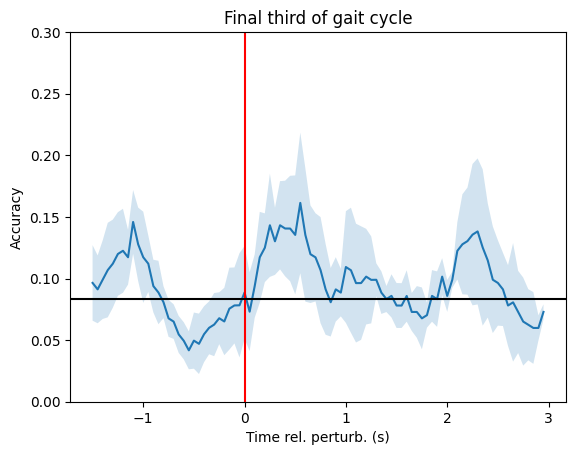

In [117]:
import scipy
fig, ax = plt.subplots()
vizutils.shaded_errorbar(ax, (time_points+50) /100, scores_gait_, errorStat=np.std)
ax.axvline(x=0, color='r')
ax.axhline(y=1/12, color='k')
ax.set_xlabel('Time rel. perturb. (s)')
ax.set_ylabel('Accuracy')
ax.set_ylim(0, 0.3)
ax.set_title('Final third of gait cycle')

In [119]:
targets.shape

(252,)

In [120]:
kinematics2.shape

(252, 51, 62)

(array([33., 17., 13., 17., 17., 13., 12., 14., 16., 34.]),
 array([ 0. ,  1.1,  2.2,  3.3,  4.4,  5.5,  6.6,  7.7,  8.8,  9.9, 11. ]),
 <BarContainer object of 10 artists>)

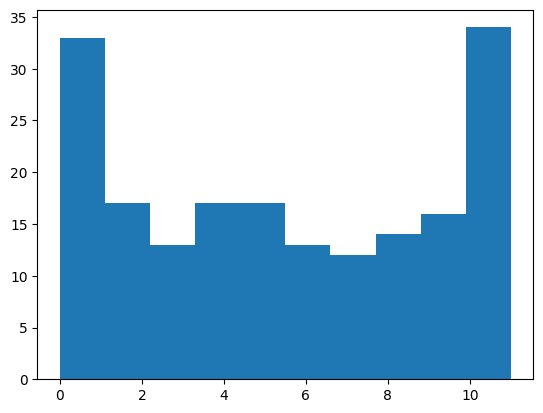

In [124]:
plt.hist(targets_for_classifc_)

In [126]:
cross_val_score(GaussianNB(), kinematics_reshaped_, targets_for_classifc_, scoring="accuracy", cv=5).mean()

0.0860597439544808

### Start again

In [2]:
handler = decode.DecodingDataHandler(data_dir='/data/bnd-data/raw/', session='M062_2025_03_20_14_00')
kinematics_for_decoding = ['left_ankle', 'left_ankle_angle', 'left_elbow', 'left_elbow_angle',
       'left_foot', 'left_knee', 'left_knee_angle', 'left_paw',
       'left_shoulder', 'left_wrist', 'left_wrist_angle', 'right_ankle',
       'right_ankle_angle', 'right_elbow', 'right_elbow_angle', 'right_foot',
       'right_knee', 'right_knee_angle', 'right_paw', 'right_shoulder',
       'right_wrist', 'right_wrist_angle', 'shoulder_center', 'tail_base',
       'tail_middle', 'tail_tip']


field values_before_camera_trigger could not be converted to int.
field idx_before_camera_trigger could not be converted to int.
array field SSp_KSLabel could not be converted to int.
array field VAL_KSLabel could not be converted to int.
array field all_KSLabel could not be converted to int.
array field CP_KSLabel could not be converted to int.
array field MOp_KSLabel could not be converted to int.
field values_Sol_direction could not be converted to int.
field idx_Sol_direction could not be converted to int.
field values_Sol_duration could not be converted to int.
field idx_Sol_duration could not be converted to int.
field idx_sol_on could not be converted to int.
array field SSp_KSLabel could not be converted to int.
array field VAL_KSLabel could not be converted to int.
array field all_KSLabel could not be converted to int.
array field CP_KSLabel could not be converted to int.
array field MOp_KSLabel could not be converted to int.
array field SSp_KSLabel could not be converted to i

/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: values_MotSen1_X might be a time-varying field. It matches the length of SSp_spikes on 99.85955056179775% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: idx_MotSen1_X might be a time-varying field. It matches the length of SSp_spikes on 99.85955056179775% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: values_MotSen1_Y might be a time-varying field. It matches the length of SSp_spikes on 99.85955056179775% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: idx_MotSen1_Y might be a time-varying field. It matches the length of SSp_spikes on 99.85955056179775% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/

Resulting SSp_spikes ephys data shape is (NxT): (118, 48000)
Resulting VAL_spikes ephys data shape is (NxT): (155, 48000)
Resulting all_spikes ephys data shape is (NxT): (34, 48000)
Resulting CP_spikes ephys data shape is (NxT): (356, 48000)
Resulting MOp_spikes ephys data shape is (NxT): (163, 48000)


In [4]:
_, kinematics = handler.get_data_and_kinematics(
        condition='trial', 
        kinematics=kinematics_for_decoding, 
        epoch=(-2, 3.5),
    )

# Define targets
directions = np.arange(12)
targets = np.repeat(directions, kinematics.shape[0]/12)

/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:27: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [710]
  df = pyal.restrict_to_interval(df, epoch_fun=epoch)
/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:18: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [710]
  df = pyal.restrict_to_interval(df, epoch_fun=epoch)
/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:147: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [710]
  df_ = pyal.restrict_to_interval(df, epoch_fun=epoch) if epoch is not None else df


In [91]:
from tools.params import Params

gait_interval = (0.5, 1)
timings = classify_perturbation_on_gait_cycle(kinematics)
perturbations_idx = np.where(
        (timings >= gait_interval[0]) & (timings <= gait_interval[1])
)[0]
kinematics_gait_locked = kinematics[perturbations_idx]
targets_gait_locked = targets[perturbations_idx]
targets_angle= [Params.sol_dir_to_angle[target] for target in targets_gait_locked]

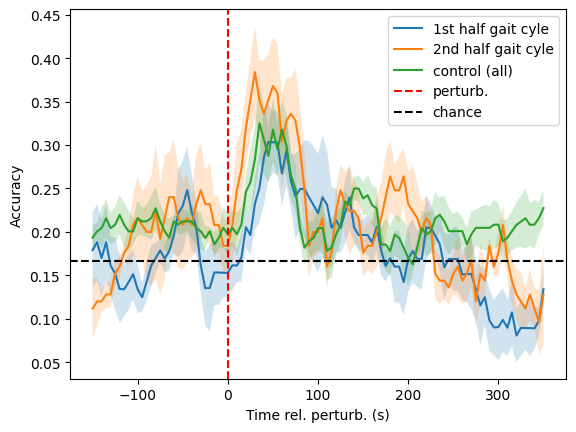

In [92]:
bin_size = 0.01

min_time_bin = int(-2 / bin_size)
max_time_bin= int(3.5 / bin_size)

window_length_bin = int(0.5 / bin_size)
step_bin = int(0.05 / bin_size)


time_points = np.arange(min_time_bin+window_length_bin, max_time_bin +1, step_bin)
moving_window_idx = np.arange(max_time_bin - min_time_bin)

scores = []
for t in np.arange(max_time_bin - min_time_bin + 1 - window_length_bin, step=step_bin):
    # print(f'Bin: {t} to {t+window_length_bin}')
    data = kinematics_gait_locked[:, t:t+window_length_bin, :]
    data = data.reshape(-1, data.shape[1]*data.shape[2])
    score = cross_val_score(GaussianNB(), data, targets_angle, scoring="accuracy", cv=5)
    scores.append(score)

scores_2 = np.array(scores)

errStat = scipy.stats.sem
fig, ax = plt.subplots()
vizutils.shaded_errorbar(ax, time_points, scores_1, errorStat=errStat, label='1st half gait cyle')
vizutils.shaded_errorbar(ax, time_points, scores_2, errorStat=errStat, label='2nd half gait cyle')
vizutils.shaded_errorbar(ax, time_points, scores_control, errorStat=errStat, label='control (all)')
ax.axvline(x=0, color='r', linestyle='dashed', label='perturb.')
ax.axhline(y=1/6, color='k', linestyle='dashed', label='chance')
ax.set_xlabel('Time rel. perturb. (s)')
ax.set_ylabel('Accuracy')
ax.legend()

(array([44.,  0., 44.,  0., 44.,  0., 44.,  0., 44., 44.]),
 array([  0.,  30.,  60.,  90., 120., 150., 180., 210., 240., 270., 300.]),
 <BarContainer object of 10 artists>)

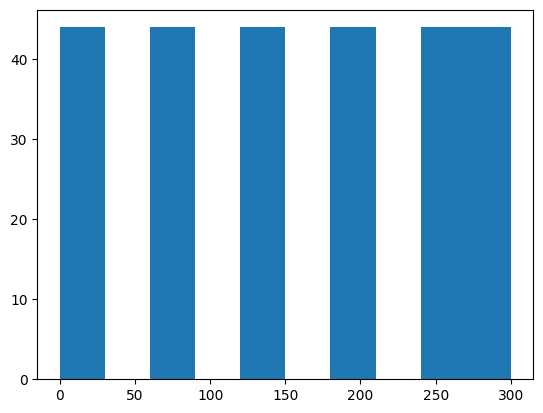

In [79]:
plt.hist(targets_angle)

In [ ]:
from tools.params import Params

gait_interval = (0.5, 1)
timings = classify_perturbation_on_gait_cycle(kinematics)
perturbations_idx = np.where(
        (timings >= gait_interval[0]) & (timings <= gait_interval[1])
)[0]
kinematics_gait_locked = kinematics[perturbations_idx]
targets_gait_locked = targets[perturbations_idx]
targets_high_low = [Params.sol_dir_to_level[target] for target in targets_gait_locked]

(array([54.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0., 58.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <BarContainer object of 10 artists>)

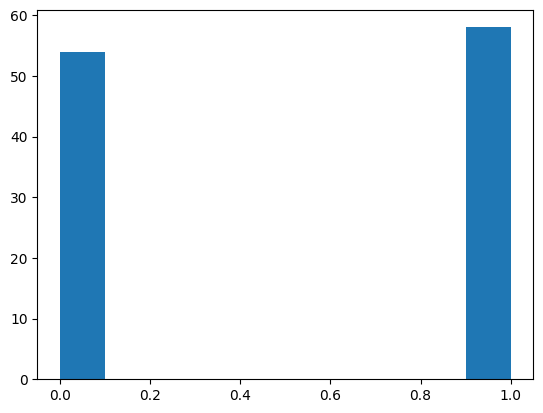

In [47]:
plt.hist(targets_high_low)

In [ ]:
# scores_control = scores

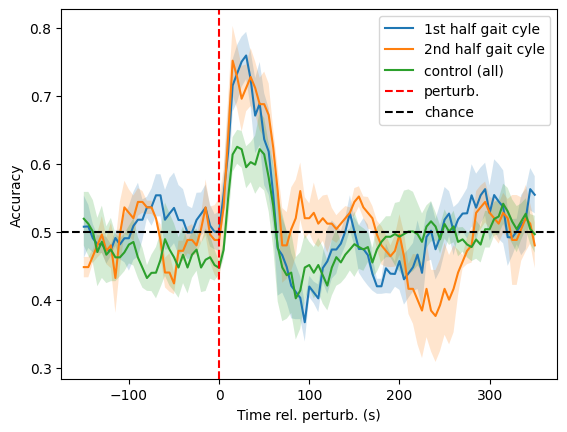

In [73]:
bin_size = 0.01

min_time_bin = int(-2 / bin_size)
max_time_bin= int(3.5 / bin_size)

window_length_bin = int(0.5 / bin_size)
step_bin = int(0.05 / bin_size)


time_points = np.arange(min_time_bin+window_length_bin, max_time_bin +1, step_bin)
moving_window_idx = np.arange(max_time_bin - min_time_bin)

scores = []
for t in np.arange(max_time_bin - min_time_bin + 1 - window_length_bin, step=step_bin):
    # print(f'Bin: {t} to {t+window_length_bin}')
    data = kinematics_gait_locked[:, t:t+window_length_bin, :]
    data = data.reshape(-1, data.shape[1]*data.shape[2])
    score = cross_val_score(GaussianNB(), data, targets_high_low, scoring="accuracy", cv=5)
    scores.append(score)

scores = np.array(scores)

errStat = scipy.stats.sem
fig, ax = plt.subplots()
vizutils.shaded_errorbar(ax, time_points, scores_1, errorStat=errStat, label='1st half gait cyle')
vizutils.shaded_errorbar(ax, time_points, scores_2, errorStat=errStat, label='2nd half gait cyle')
vizutils.shaded_errorbar(ax, time_points, scores_control, errorStat=errStat, label='control (all)')
ax.axvline(x=0, color='r', linestyle='dashed', label='perturb.')
ax.axhline(y=1/2, color='k', linestyle='dashed', label='chance')
ax.set_xlabel('Time rel. perturb. (s)')
ax.set_ylabel('Accuracy')
ax.legend()

Text(0.5, 0, 'Time rel. perturb. (s)')

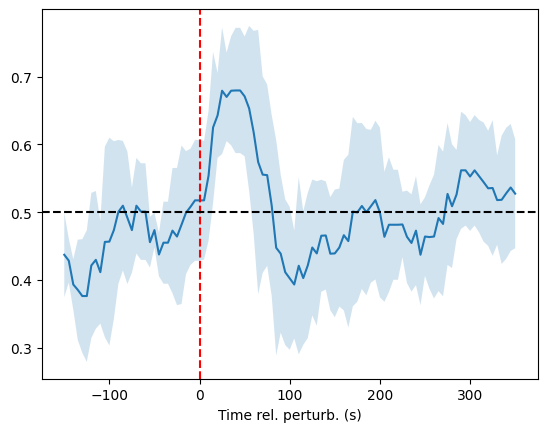

In [28]:
bin_size = 0.01

min_time_bin = int(-2 / bin_size)
max_time_bin= int(3.5 / bin_size)

window_length_bin = int(0.5 / bin_size)
step_bin = int(0.05 / bin_size)


time_points = np.arange(min_time_bin+window_length_bin, max_time_bin +1, step_bin)
moving_window_idx = np.arange(max_time_bin - min_time_bin)

scores = []
for t in np.arange(max_time_bin - min_time_bin + 1 - window_length_bin, step=step_bin):
    # print(f'Bin: {t} to {t+window_length_bin}')
    data = kinematics_gait_locked[:, t:t+window_length_bin, :]
    data = data.reshape(-1, data.shape[1]*data.shape[2])
    score = cross_val_score(GaussianNB(), data, targets_high_low, scoring="accuracy", cv=5)
    scores.append(score)

scores = np.array(scores)


fig, ax = plt.subplots()
vizutils.shaded_errorbar(ax, time_points, scores, errorStat=np.std)
ax.axvline(x=0, color='r', linestyle='dashed')
ax.axhline(y=1/2, color='k', linestyle='dashed')
ax.set_xlabel('Time rel. perturb. (s)')

In [9]:
bin_size = 0.01

min_time_bin = int(-2 / bin_size)
max_time_bin= int(3.5 / bin_size)

window_length_bin = int(0.5 / bin_size)
step_bin = int(0.05 / bin_size)


time_points = np.arange(min_time_bin+window_length_bin, max_time_bin +1, step_bin)
moving_window_idx = np.arange(max_time_bin - min_time_bin)

scores = []
for t in np.arange(max_time_bin - min_time_bin + 1 - window_length_bin, step=step_bin):
    # print(f'Bin: {t} to {t+window_length_bin}')
    data = kinematics[:, t:t+window_length_bin, :]
    data = data.reshape(-1, data.shape[1]*data.shape[2])
    score = cross_val_score(GaussianNB(), data, targets, scoring="accuracy", cv=5)
    scores.append(score)

scores = np.array(scores)

In [10]:
time_points

array([-150, -145, -140, -135, -130, -125, -120, -115, -110, -105, -100,
        -95,  -90,  -85,  -80,  -75,  -70,  -65,  -60,  -55,  -50,  -45,
        -40,  -35,  -30,  -25,  -20,  -15,  -10,   -5,    0,    5,   10,
         15,   20,   25,   30,   35,   40,   45,   50,   55,   60,   65,
         70,   75,   80,   85,   90,   95,  100,  105,  110,  115,  120,
        125,  130,  135,  140,  145,  150,  155,  160,  165,  170,  175,
        180,  185,  190,  195,  200,  205,  210,  215,  220,  225,  230,
        235,  240,  245,  250,  255,  260,  265,  270,  275,  280,  285,
        290,  295,  300,  305,  310,  315,  320,  325,  330,  335,  340,
        345,  350])

Text(0.5, 0, 'Time rel. perturb. (s)')

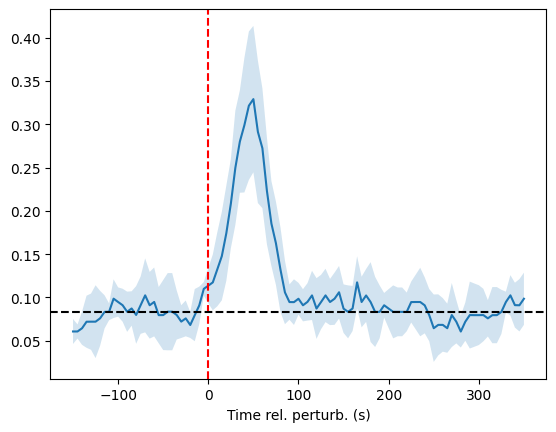

In [11]:
import scipy
fig, ax = plt.subplots()
vizutils.shaded_errorbar(ax, time_points, scores, errorStat=np.std)
ax.axvline(x=0, color='r', linestyle='dashed')
ax.axhline(y=1/12, color='k', linestyle='dashed')
ax.set_xlabel('Time rel. perturb. (s)')

In [5]:
def decode_perturb_dir_from_data_or_kinematics(
    handler, keypoints=None, area='MOp', epoch=(-2, 3.5), bin_size=0.01, window_length_s=0.5, step_s=0.05, k=5, query=None):
    if keypoints=='all':
        keypoints = ['left_ankle', 'left_ankle_angle', 'left_elbow', 'left_elbow_angle',
       'left_foot', 'left_knee', 'left_knee_angle', 'left_paw',
       'left_shoulder', 'left_wrist', 'left_wrist_angle', 'right_ankle',
       'right_ankle_angle', 'right_elbow', 'right_elbow_angle', 'right_foot',
       'right_knee', 'right_knee_angle', 'right_paw', 'right_shoulder',
       'right_wrist', 'right_wrist_angle', 'shoulder_center', 'tail_base',
       'tail_middle', 'tail_tip']
        
    if not isinstance(keypoints, list) and keypoints is not None:
        keypoints = [keypoints]

    # Get data
    data = handler.get_data_and_kinematics(
        area=area,
        condition='trial', 
        kinematics=keypoints, 
        epoch=epoch,
        query=query
    )
    if keypoints is not None:  # kinematics only
        _, data = data        

    # Define targets
    directions = np.arange(12)
    targets = np.repeat(directions, data.shape[0]/12)


    # Define time
    min_time_bin = int(epoch[0] / bin_size)
    max_time_bin= int(epoch[1] / bin_size)

    window_length_bin = int(window_length_s / bin_size)
    step_bin = int(step_s / bin_size)

    time_points = np.arange(min_time_bin+window_length_bin, max_time_bin +1, step_bin)

    # Decode
    scores = []
    for t in np.arange(max_time_bin - min_time_bin + 1 - window_length_bin, step=step_bin):
        data_ = data[:, t:t+window_length_bin, :]
        data_ = data_.reshape(-1, data_.shape[1]*data_.shape[2])
        score = cross_val_score(GaussianNB(), data_, targets, scoring="accuracy", cv=k)
        scores.append(score)

    scores = np.array(scores)

    return scores, time_points*bin_size

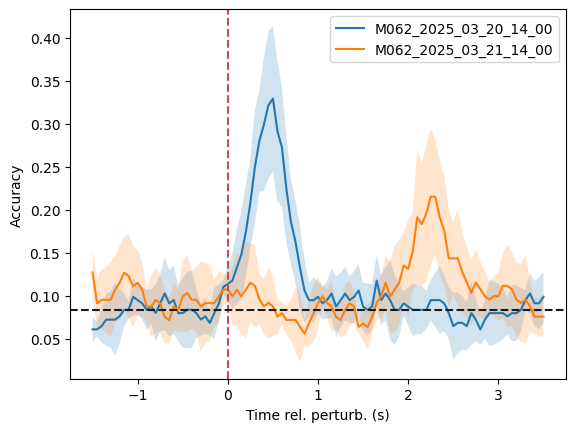

In [20]:
# with vizutils.apply_plot_style('notebook'):
fig, ax = plt.subplots()
vizutils.shaded_errorbar(ax, time_points, scores_sess_1, errorStat=np.std, label='M062_2025_03_20_14_00')
vizutils.shaded_errorbar(ax, time_points, scores_sess_2, errorStat=np.std, label='M062_2025_03_21_14_00')
ax.axvline(x=0, color='r', linestyle='dashed')
ax.axhline(y=1/12, color='k', linestyle='dashed')
ax.set_xlabel('Time rel. perturb. (s)')
ax.set_ylabel('Accuracy')
ax.legend()

### Formatted into function

In [93]:
sessions = [
    # 'M046_2024_12_18_16_00'
    # 'M046_2024_12_19_13_30',
    # "M061_2025_03_04_10_00",
    # "M061_2025_03_05_14_00",
    # "M061_2025_03_06_14_00",
    # "M062_2025_03_19_14_00",
    "M062_2025_03_20_14_00",
    "M062_2025_03_21_14_00",
    # "M063_2025_03_12_14_00",
    # "M063_2025_03_13_14_00",
    # "M063_2025_03_14_15_30",
]

handlers = []
for session in sessions:
    handlers.append(decode.DecodingDataHandler(data_dir='/data/bnd-data/raw/', session=session))


field values_before_camera_trigger could not be converted to int.
field idx_before_camera_trigger could not be converted to int.
array field SSp_KSLabel could not be converted to int.
array field VAL_KSLabel could not be converted to int.
array field all_KSLabel could not be converted to int.
array field CP_KSLabel could not be converted to int.
array field MOp_KSLabel could not be converted to int.
field values_Sol_direction could not be converted to int.
field idx_Sol_direction could not be converted to int.
field values_Sol_duration could not be converted to int.
field idx_Sol_duration could not be converted to int.
field idx_sol_on could not be converted to int.
array field SSp_KSLabel could not be converted to int.
array field VAL_KSLabel could not be converted to int.
array field all_KSLabel could not be converted to int.
array field CP_KSLabel could not be converted to int.
array field MOp_KSLabel could not be converted to int.
array field SSp_KSLabel could not be converted to i

/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: values_MotSen1_X might be a time-varying field. It matches the length of SSp_spikes on 99.85955056179775% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: idx_MotSen1_X might be a time-varying field. It matches the length of SSp_spikes on 99.85955056179775% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: values_MotSen1_Y might be a time-varying field. It matches the length of SSp_spikes on 99.85955056179775% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: idx_MotSen1_Y might be a time-varying field. It matches the length of SSp_spikes on 99.85955056179775% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/

Resulting SSp_spikes ephys data shape is (NxT): (118, 48000)
Resulting VAL_spikes ephys data shape is (NxT): (155, 48000)
Resulting all_spikes ephys data shape is (NxT): (34, 48000)
Resulting CP_spikes ephys data shape is (NxT): (356, 48000)
Resulting MOp_spikes ephys data shape is (NxT): (163, 48000)
field values_before_camera_trigger could not be converted to int.
field idx_before_camera_trigger could not be converted to int.
array field VAL_KSLabel could not be converted to int.
array field SSp_KSLabel could not be converted to int.
array field all_KSLabel could not be converted to int.
array field MOp_KSLabel could not be converted to int.
array field CP_KSLabel could not be converted to int.
field values_Sol_direction could not be converted to int.
field idx_Sol_direction could not be converted to int.
field values_Sol_duration could not be converted to int.
field idx_Sol_duration could not be converted to int.
field idx_sol_on could not be converted to int.
array field VAL_KSLabe

/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: values_MotSen1_X might be a time-varying field. It matches the length of VAL_spikes on 99.85875706214689% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: idx_MotSen1_X might be a time-varying field. It matches the length of VAL_spikes on 99.85875706214689% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: values_MotSen1_Y might be a time-varying field. It matches the length of VAL_spikes on 99.85875706214689% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: idx_MotSen1_Y might be a time-varying field. It matches the length of VAL_spikes on 99.85875706214689% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/

Resulting VAL_spikes ephys data shape is (NxT): (122, 48000)
Resulting SSp_spikes ephys data shape is (NxT): (66, 48000)
Resulting all_spikes ephys data shape is (NxT): (23, 48000)
Resulting MOp_spikes ephys data shape is (NxT): (179, 48000)
Resulting CP_spikes ephys data shape is (NxT): (280, 48000)


/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:27: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [710]
  df = pyal.restrict_to_interval(df, epoch_fun=epoch)
/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:18: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [710]
  df = pyal.restrict_to_interval(df, epoch_fun=epoch)
/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:147: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [710]
  df_ = pyal.restrict_to_interval(df, epoch_fun=epoch) if epoch is not None else df
/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:27: UserWarnin

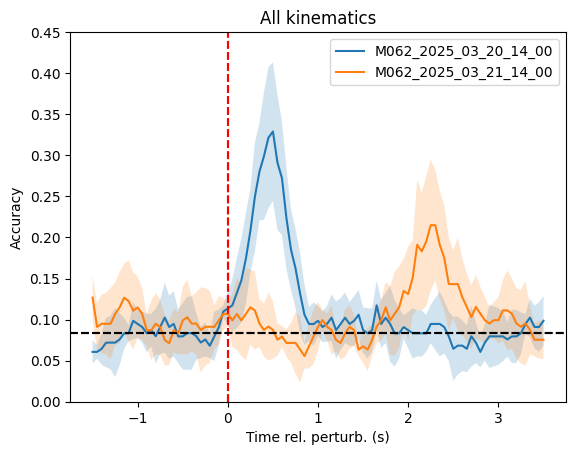

In [97]:
fig, ax = plt.subplots()
for handler in handlers:
    scores, time_points = decode_perturb_dir_from_data_or_kinematics(handler, keypoints='all')
    vizutils.shaded_errorbar(ax, time_points, scores, errorStat=np.std, label=handler.session)
    ax.axvline(x=0, color='r', linestyle='dashed')
    ax.axhline(y=1/12, color='k', linestyle='dashed')
    ax.set_xlabel('Time rel. perturb. (s)')
    ax.set_ylabel('Accuracy')
    ax.set_ylim(0, 0.45)
    ax.legend()
    ax.set_title('All kinematics')

/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:27: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [706]
  df = pyal.restrict_to_interval(df, epoch_fun=epoch)
/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:18: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [706]
  df = pyal.restrict_to_interval(df, epoch_fun=epoch)
/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:147: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [706]
  df_ = pyal.restrict_to_interval(df, epoch_fun=epoch) if epoch is not None else df
/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:27: UserWarnin

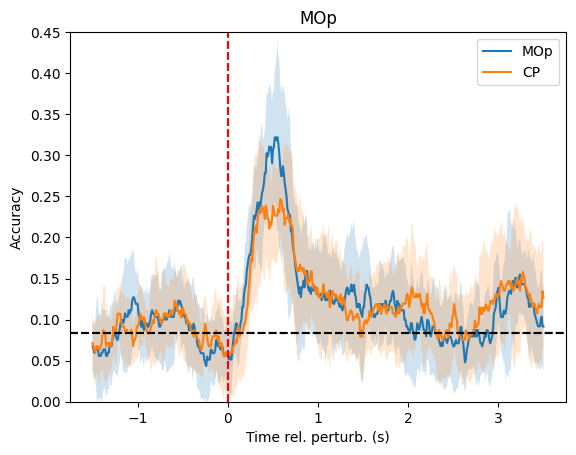

In [107]:
fig, ax = plt.subplots()
for area in ['MOp', 'CP']:
    scores, time_points = decode_perturb_dir_from_data_or_kinematics(handlers[1], area=area, step_s=0.01, k=10)
    vizutils.shaded_errorbar(ax, time_points, scores, errorStat=np.std, label=area)
    ax.axvline(x=0, color='r', linestyle='dashed')
    ax.axhline(y=1/12, color='k', linestyle='dashed')
    ax.set_xlabel('Time rel. perturb. (s)')
    ax.set_ylabel('Accuracy')
    ax.set_ylim(0, 0.45)
    ax.legend()
    ax.set_title('MOp')

/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:27: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [710]
  df = pyal.restrict_to_interval(df, epoch_fun=epoch)
/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:18: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [710]
  df = pyal.restrict_to_interval(df, epoch_fun=epoch)
/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:147: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [710]
  df_ = pyal.restrict_to_interval(df, epoch_fun=epoch) if epoch is not None else df
/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:27: UserWarnin

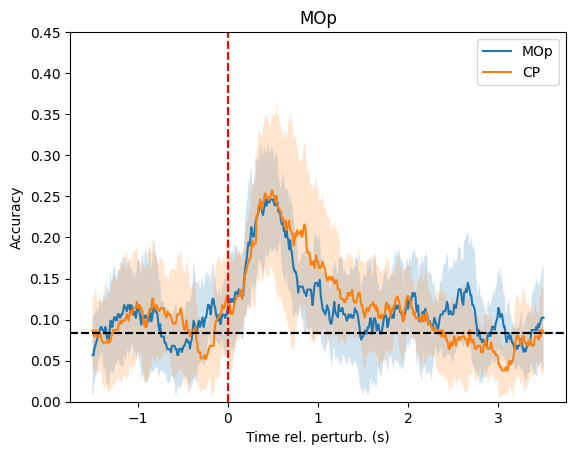

In [106]:
fig, ax = plt.subplots()
for area in ['MOp', 'CP']:
    scores, time_points = decode_perturb_dir_from_data_or_kinematics(handlers[0], area=area, step_s=0.01, k=10)
    vizutils.shaded_errorbar(ax, time_points, scores, errorStat=np.std, label=area)
    ax.axvline(x=0, color='r', linestyle='dashed')
    ax.axhline(y=1/12, color='k', linestyle='dashed')
    ax.set_xlabel('Time rel. perturb. (s)')
    ax.set_ylabel('Accuracy')
    ax.set_ylim(0, 0.45)
    ax.legend()
    ax.set_title('MOp')

/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:27: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [710]
  df = pyal.restrict_to_interval(df, epoch_fun=epoch)
/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:18: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [710]
  df = pyal.restrict_to_interval(df, epoch_fun=epoch)
/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:147: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [710]
  df_ = pyal.restrict_to_interval(df, epoch_fun=epoch) if epoch is not None else df
/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:27: UserWarnin

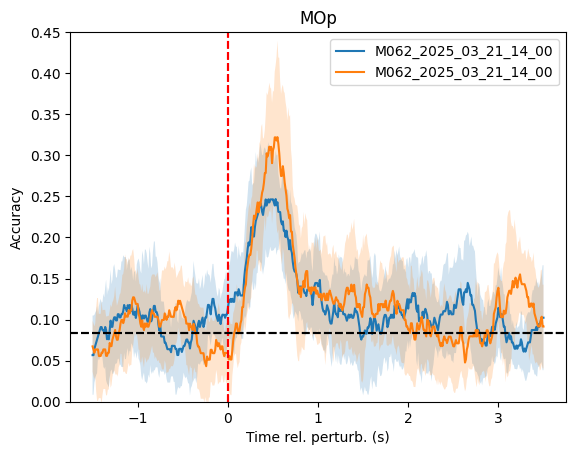

In [105]:
fig, ax = plt.subplots()
for handler in handlers:
    scores, time_points = decode_perturb_dir_from_data_or_kinematics(handler, area='MOp', step_s=0.01, k=10)
    vizutils.shaded_errorbar(ax, time_points, scores, errorStat=np.std, label=session)
    ax.axvline(x=0, color='r', linestyle='dashed')
    ax.axhline(y=1/12, color='k', linestyle='dashed')
    ax.set_xlabel('Time rel. perturb. (s)')
    ax.set_ylabel('Accuracy')
    ax.set_ylim(0, 0.45)
    ax.legend()
    ax.set_title('MOp')

/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:27: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [710]
  df = pyal.restrict_to_interval(df, epoch_fun=epoch)
/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:18: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [710]
  df = pyal.restrict_to_interval(df, epoch_fun=epoch)
/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:147: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [710]
  df_ = pyal.restrict_to_interval(df, epoch_fun=epoch) if epoch is not None else df
/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:27: UserWarnin

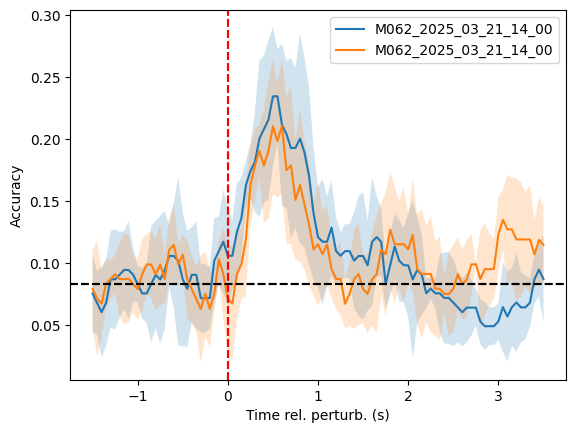

In [7]:
fig, ax = plt.subplots()
for handler in handlers:
    scores, time_points = decode_perturb_dir_from_data_or_kinematics(handler, area='CP')
    vizutils.shaded_errorbar(ax, time_points, scores, errorStat=np.std, label=session)
    ax.axvline(x=0, color='r', linestyle='dashed')
    ax.axhline(y=1/12, color='k', linestyle='dashed')
    ax.set_xlabel('Time rel. perturb. (s)')
    ax.set_ylabel('Accuracy')
    ax.legend()

In [ ]:
for _ in range(3):
    werwer

/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:27: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [706]
  df = pyal.restrict_to_interval(df, epoch_fun=epoch)
/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:18: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [706]
  df = pyal.restrict_to_interval(df, epoch_fun=epoch)
/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:147: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [706]
  df_ = pyal.restrict_to_interval(df, epoch_fun=epoch) if epoch is not None else df
/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:27: UserWarnin

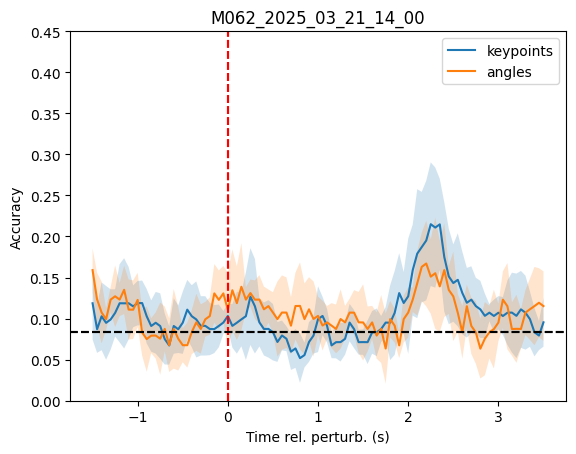

In [20]:
keypoints = ['left_ankle', 'left_elbow',
       'left_foot', 'left_knee', 'left_paw',
       'left_shoulder', 'left_wrist', 'right_ankle','right_elbow', 'right_foot',
       'right_knee', 'right_paw', 'right_shoulder',
       'right_wrist', 'shoulder_center', 'tail_base',
       'tail_middle', 'tail_tip']

angles = ['left_ankle_angle', 'left_elbow_angle','left_knee_angle',
       'left_wrist_angle',
       'right_ankle_angle', 'right_elbow_angle', 'right_knee_angle',
       'right_wrist_angle']

fig, ax = plt.subplots()
for keypoint, label in zip([keypoints, angles], ('keypoints', 'angles')):
    scores, time_points = decode_perturb_dir_from_data_or_kinematics(handlers[1], keypoints=keypoint)
    vizutils.shaded_errorbar(ax, time_points, scores, errorStat=np.std, label=label)
    ax.axvline(x=0, color='r', linestyle='dashed')
    ax.axhline(y=1/12, color='k', linestyle='dashed')
    ax.set_xlabel('Time rel. perturb. (s)')
    ax.set_ylabel('Accuracy')
    ax.set_ylim(0, 0.45)
    ax.legend()
    ax.set_title(handlers[1].session)

In [35]:
_, kinematics = handlers[0].get_data_and_kinematics(condition='trial', kinematics=['right_knee'], epoch=(-0.5, 3.5))

/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:27: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [710]
  df = pyal.restrict_to_interval(df, epoch_fun=epoch)
/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:18: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [710]
  df = pyal.restrict_to_interval(df, epoch_fun=epoch)
/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:147: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [710]
  df_ = pyal.restrict_to_interval(df, epoch_fun=epoch) if epoch is not None else df


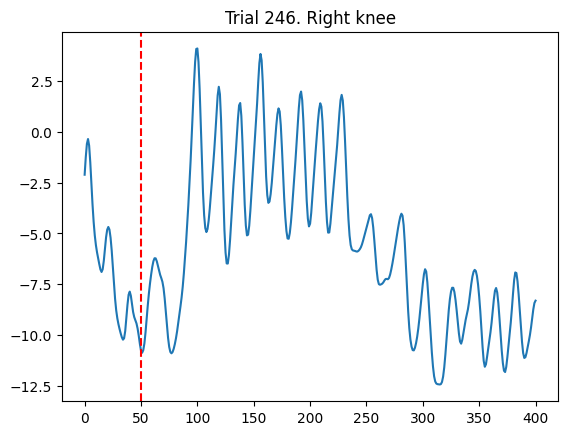

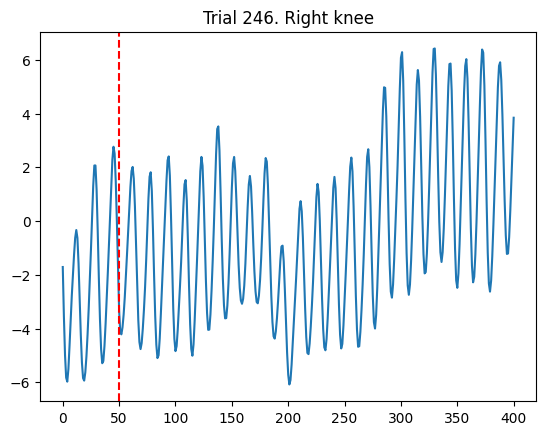

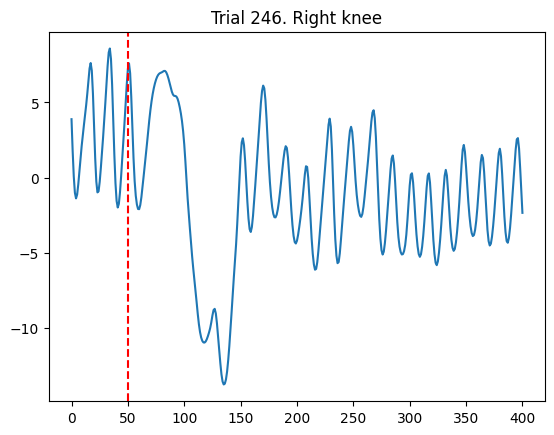

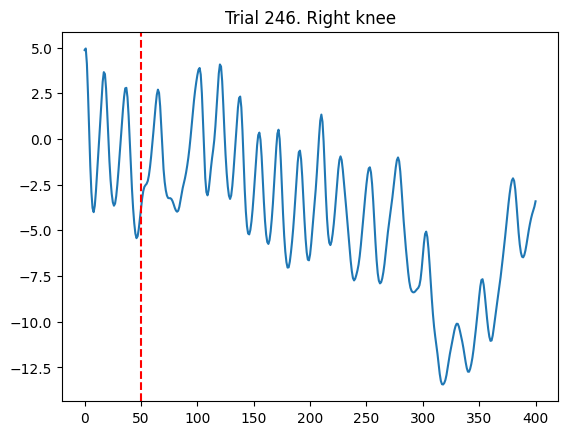

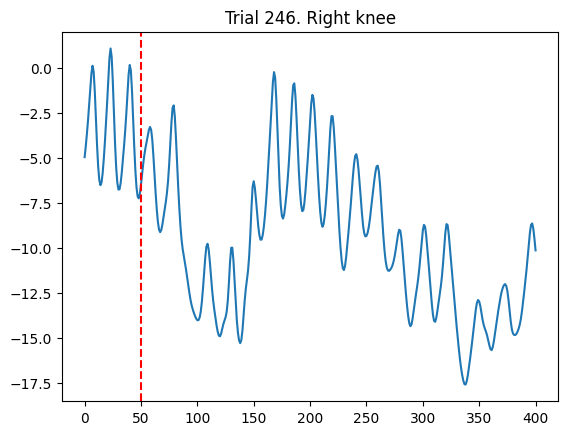

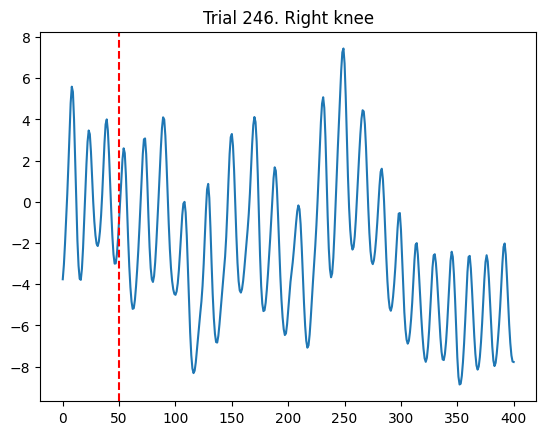

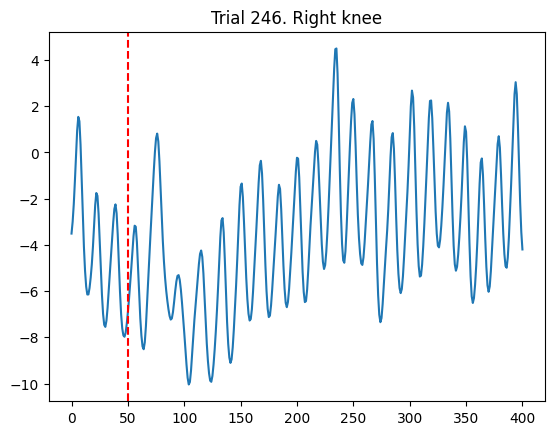

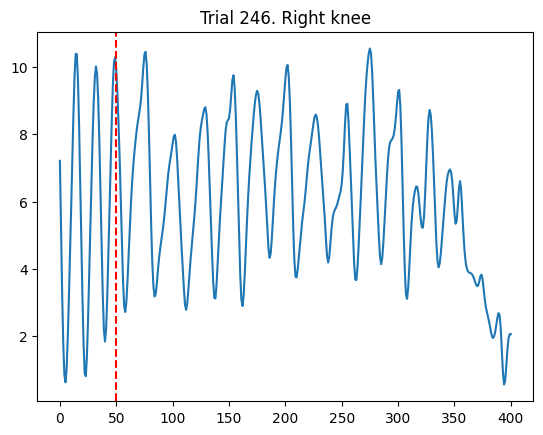

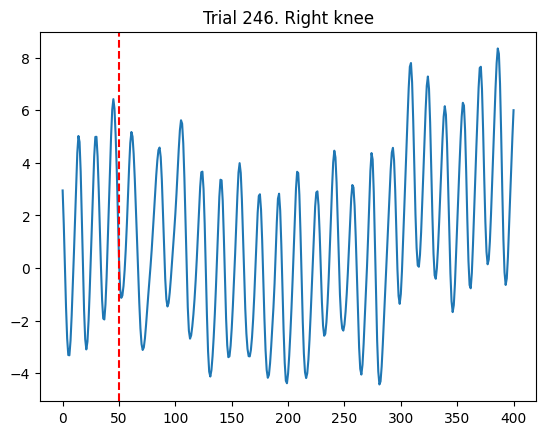

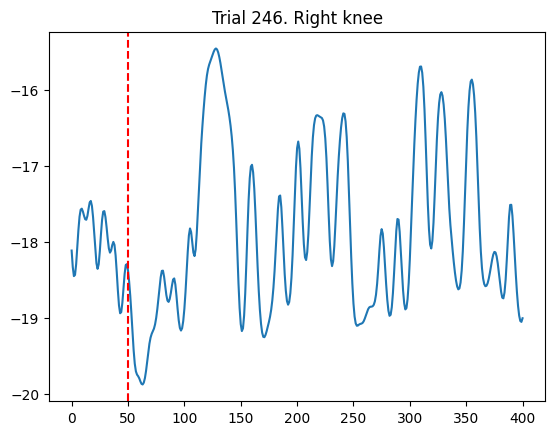

In [65]:
for tr in np.arange(240, 250):
    # trial = 246
    fig, ax = plt.subplots()
    ax.plot(kinematics[tr, :, 0])
    ax.axvline(50, color='r', linestyle='dashed')
    ax.set_title(f'Trial {trial}. Right knee')


In [156]:
df = handlers[1].df

In [157]:
df = df.iloc[-40:-2]

In [160]:
df.head()

,animal,session,trial_id,trial_name,trial_length,bin_size,idx_trial_start,idx_trial_end,idx_CPI,values_before_camera_trigger,...,CP_unit_guide,CP_KSLabel,CP_spikes,VAL_rates,SSp_rates,all_rates,MOp_rates,CP_rates,sol_level_id,sol_contra_ipsi
668,M062,M062_2025_03_21_14_00,668,trial,600,0.01,347403,348002,[],[],...,"[[0, 1], [1, 1], [1, 6], [4, 1], [4, 2], [5, 2...","[good, good, good, good, mua, good, good, good...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[18.676012, 1.2302874, 13.872892, 15.841568, ...","[[0.0, 30.593494, 1.2302874, 0.0, 0.0008981009...","[[13.894269, 0.0, 0.7852407, 0.09745678, 0.0, ...","[[13.18918, 0.0, 0.0, 0.010280845, 0.0, 0.0, 3...","[[0.043074407, 0.3565453, 0.0, 2.7606552, 0.0,...",0.0,0.0
669,M062,M062_2025_03_21_14_00,669,intertrial,300,0.01,348003,348302,[],[],...,"[[0, 1], [1, 1], [1, 6], [4, 1], [4, 2], [5, 2...","[good, good, good, good, mua, good, good, good...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[12.82933, 0.16378297, 0.0, 27.084444, 0.0, 0...","[[0.0, 31.508396, 26.524416, 15.614507, 11.267...","[[42.37223, 0.0, 15.566815, 3.9456174, 0.01028...","[[11.377089, 0.0, 0.0, 0.0, 1.2302874, 0.0, 0....","[[0.010280845, 0.04294701, 0.0, 0.00012739658,...",NaN,NaN
670,M062,M062_2025_03_21_14_00,670,trial,600,0.01,348303,348902,[],[],...,"[[0, 1], [1, 1], [1, 6], [4, 1], [4, 2], [5, 2...","[good, good, good, good, mua, good, good, good...","[[0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0,...","[[26.073128, 0.0, 1.2302386, 22.274961, 0.0, 8...","[[0.0, 2.0052474, 11.173942, 15.133868, 0.0, 3...","[[0.021426776, 0.0, 15.566815, 3.903039, 0.0, ...","[[0.85775, 0.0, 0.0, 0.0, 0.0, 0.0, 3.9858289,...","[[0.04294701, 17.681427, 0.0, 0.082790084, 0.0...",0.0,0.0
671,M062,M062_2025_03_21_14_00,671,intertrial,500,0.01,348903,349402,[],[],...,"[[0, 1], [1, 1], [1, 6], [4, 1], [4, 2], [5, 2...","[good, good, good, good, mua, good, good, good...","[[0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[27.476278, 0.0, 8.749083, 7.100902, 0.0, 6.9...","[[6.9477677, 51.620605, 15.957654, 6.663374, 2...","[[0.004743816, 0.0, 0.0, 0.010280845, 0.002104...","[[0.010408241, 0.0, 1.8788582, 0.0, 0.0, 0.010...","[[3.902798, 17.483948, 15.566815, 2.7606552, 0...",NaN,NaN
672,M062,M062_2025_03_21_14_00,672,trial,600,0.01,349403,350002,[],[],...,"[[0, 1], [1, 1], [1, 6], [4, 1], [4, 2], [5, 2...","[good, good, good, good, mua, good, good, good...","[[0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0,...","[[35.67912, 0.0, 21.871395, 5.3108296, 0.0, 0....","[[0.0, 30.407967, 15.697879, 0.0, 34.264713, 6...","[[13.955634, 0.0, 0.4696169, 13.872843, 16.036...","[[23.739729, 0.0, 0.0, 0.0, 0.0, 12.363018, 2....","[[0.082790084, 6.9688263, 0.0, 0.0, 0.0, 29.52...",0.0,1.0


In [158]:
kinematics = np.concatenate(df.left_ankle_angle.values)

In [161]:
perturbations = []
for _, row in df.iterrows():
    if row['trial_name'] == 'trial':
        perturbations.append(row['idx_trial_start'] + row['idx_sol_on'])

perturbations = np.array(perturbations) - 347403

In [108]:
perturbations

array([  200,  1100,  2200,  3300,  4200,  5100,  5800,  6900,  8000,
        8900, 10000, 11100, 12000, 12700, 13600, 14300, 15200, 16300,
       17200])

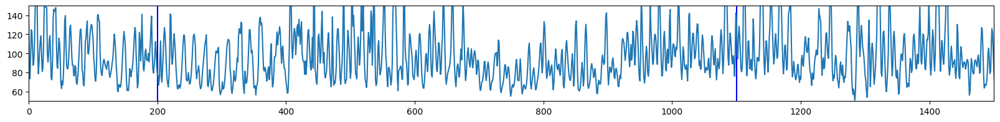

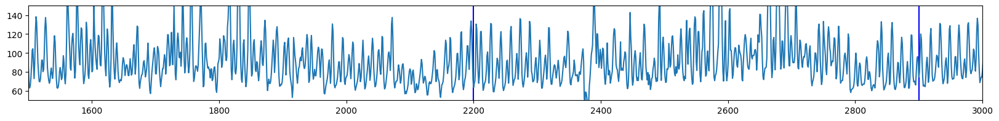

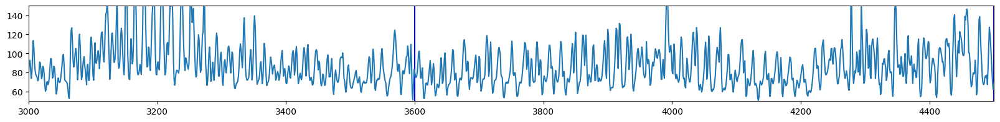

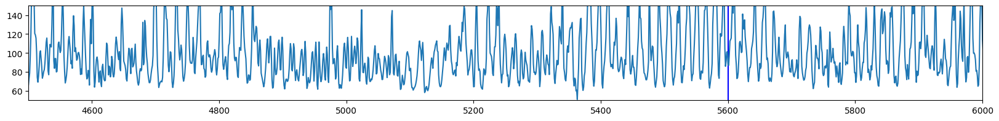

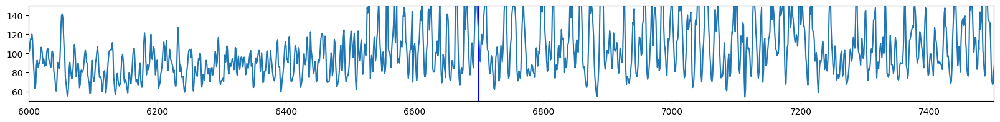

...

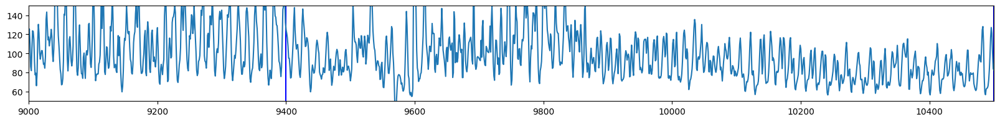

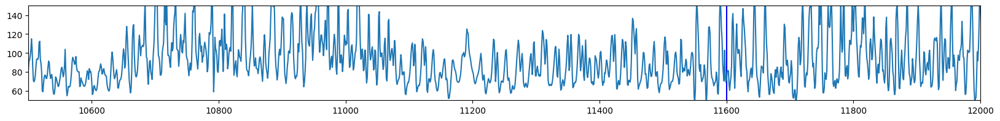

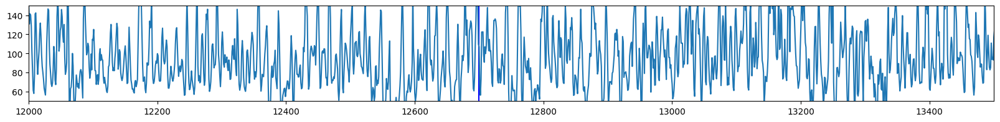

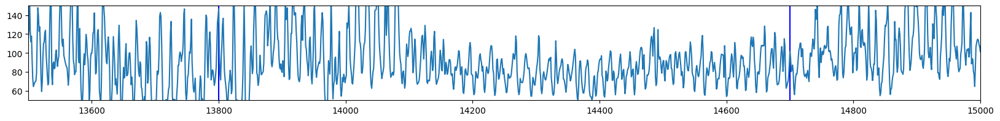

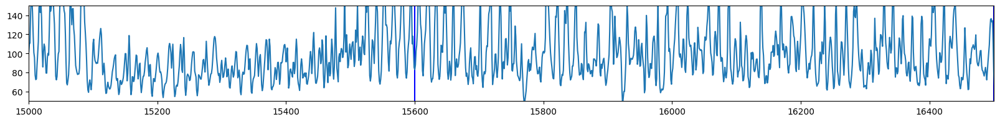

In [162]:
for intervals in np.arange(0, 16000, step=1500):
    fig, ax = plt.subplots(figsize=(20, 2))
    ax.vlines(perturbations, ymin=0, ymax=1000, color='blue')
    ax.plot(kinematics)
    ax.set_ylim(50, 150)
    ax.set_xlim(intervals, intervals+1500)


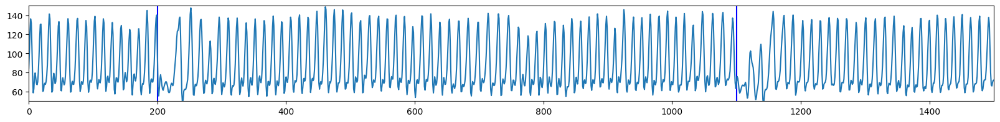

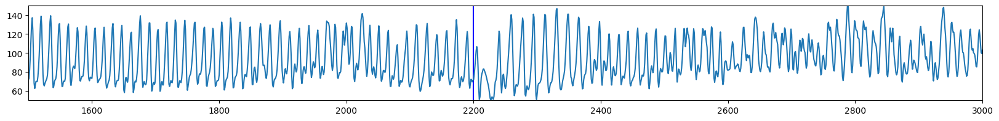

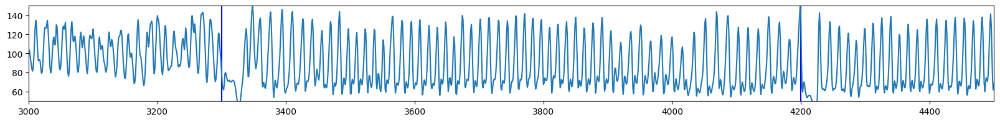

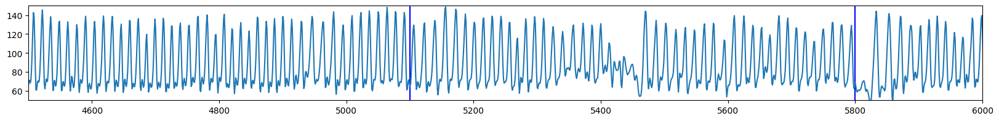

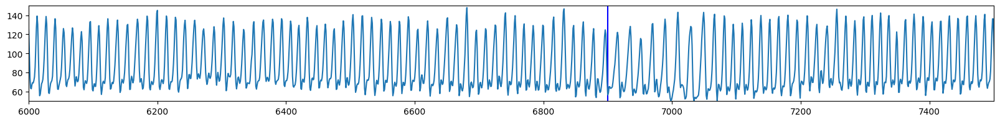

...

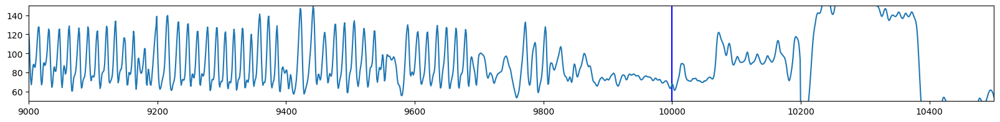

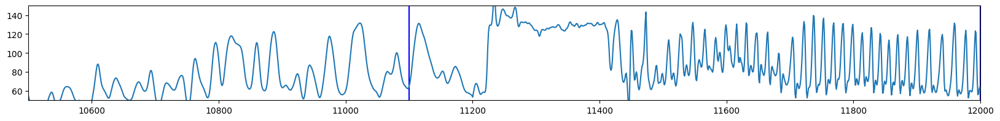

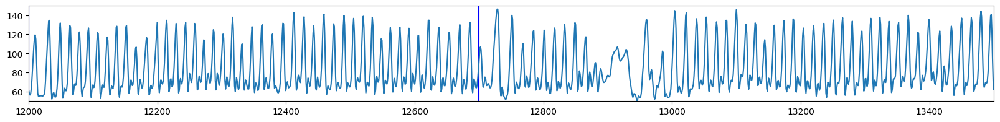

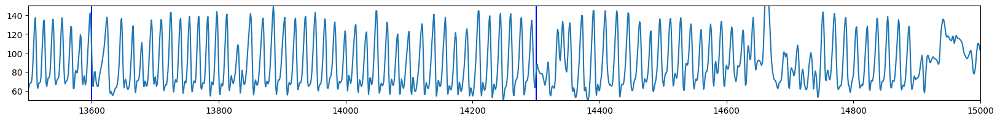

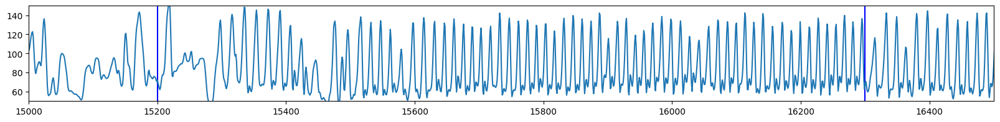

In [155]:
for intervals in np.arange(0, 16000, step=1500):
    fig, ax = plt.subplots(figsize=(20, 2))
    ax.vlines(perturbations, ymin=0, ymax=1000, color='blue')
    ax.plot(kinematics)
    ax.set_ylim(50, 150)
    ax.set_xlim(intervals, intervals+1500)


(18000.0, 19000.0)

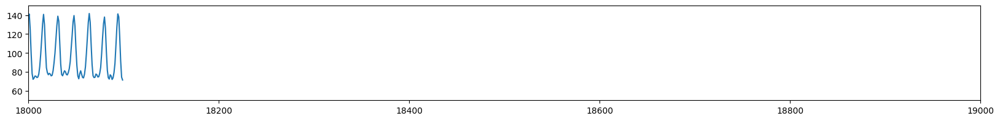

In [139]:
fig, ax = plt.subplots(figsize=(20, 2))
ax.vlines(perturbations, ymin=-1000, ymax=1000, color='blue')
ax.plot(kinematics)
ax.set_ylim(50, 150)
ax.set_xlim(18000, 19000)


### Does neural data decoding improve with gait locked trials?

In [149]:
handler = decode.DecodingDataHandler(data_dir='/data/bnd-data/raw/', session='M062_2025_03_20_14_00')

field values_before_camera_trigger could not be converted to int.
field idx_before_camera_trigger could not be converted to int.
array field SSp_KSLabel could not be converted to int.
array field VAL_KSLabel could not be converted to int.
array field all_KSLabel could not be converted to int.
array field CP_KSLabel could not be converted to int.
array field MOp_KSLabel could not be converted to int.
field values_Sol_direction could not be converted to int.
field idx_Sol_direction could not be converted to int.
field values_Sol_duration could not be converted to int.
field idx_Sol_duration could not be converted to int.
field idx_sol_on could not be converted to int.
array field SSp_KSLabel could not be converted to int.
array field VAL_KSLabel could not be converted to int.
array field all_KSLabel could not be converted to int.
array field CP_KSLabel could not be converted to int.
array field MOp_KSLabel could not be converted to int.
array field SSp_KSLabel could not be converted to i

/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: values_MotSen1_X might be a time-varying field. It matches the length of SSp_spikes on 99.85955056179775% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: idx_MotSen1_X might be a time-varying field. It matches the length of SSp_spikes on 99.85955056179775% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: values_MotSen1_Y might be a time-varying field. It matches the length of SSp_spikes on 99.85955056179775% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: idx_MotSen1_Y might be a time-varying field. It matches the length of SSp_spikes on 99.85955056179775% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/

Resulting SSp_spikes ephys data shape is (NxT): (118, 48000)
Resulting VAL_spikes ephys data shape is (NxT): (155, 48000)
Resulting all_spikes ephys data shape is (NxT): (34, 48000)
Resulting CP_spikes ephys data shape is (NxT): (356, 48000)
Resulting MOp_spikes ephys data shape is (NxT): (163, 48000)


In [114]:
# Use only 50ms and 100 ms perturbations
tmp_df = pyal.select_trials(handler.df, 'values_Sol_duration > 100 and values_Sol_duration < 300')
handler.df = tmp_df

In [150]:
kinematics_for_decoding = ['left_ankle', 'left_ankle_angle', 'left_elbow', 'left_elbow_angle',
       'left_foot', 'left_knee', 'left_knee_angle', 'left_paw',
       'left_shoulder', 'left_wrist', 'left_wrist_angle', 'right_ankle',
       'right_ankle_angle', 'right_elbow', 'right_elbow_angle', 'right_foot',
       'right_knee', 'right_knee_angle', 'right_paw', 'right_shoulder',
       'right_wrist', 'right_wrist_angle', 'shoulder_center', 'tail_base',
       'tail_middle', 'tail_tip']
data, kinematics = handler.get_data_and_kinematics(
        condition='trial', 
        kinematics=kinematics_for_decoding, 
        epoch=(-2, 3.5),
        area='CP'
    )

# Define targets
directions = np.arange(12)
targets = np.repeat(directions, kinematics.shape[0]/12)

/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:27: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [710]
  df = pyal.restrict_to_interval(df, epoch_fun=epoch)
/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:18: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [710]
  df = pyal.restrict_to_interval(df, epoch_fun=epoch)
/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:147: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [710]
  df_ = pyal.restrict_to_interval(df, epoch_fun=epoch) if epoch is not None else df


In [172]:
from tools.params import Params

gait_interval = (0, 0.25)
timings = classify_perturbation_on_gait_cycle(kinematics)
perturbations_idx = np.where(
        (timings >= gait_interval[0]) & (timings <= gait_interval[1])
)[0]
data_first = kinematics[perturbations_idx]
targets_gait_locked = targets[perturbations_idx]
targets_high_low_first= [Params.sol_dir_to_level[target] for target in targets_gait_locked]
# targets_high_low_first = targets_gait_locked

gait_interval = (0.5, 0.75)
timings = classify_perturbation_on_gait_cycle(kinematics)
perturbations_idx = np.where(
        (timings >= gait_interval[0]) & (timings <= gait_interval[1])
)[0]
data_second = kinematics[perturbations_idx]
targets_gait_locked = targets[perturbations_idx]
targets_high_low_second= [Params.sol_dir_to_level[target] for target in targets_gait_locked]
# targets_high_low_second = targets_gait_locked


import random
random_trials = random.sample(range(1, kinematics.shape[0]), len(targets_high_low_first))

data_control = kinematics[random_trials]
targets_gait_locked = targets[random_trials]
targets_control = [Params.sol_dir_to_level[target] for target in targets_gait_locked]
# targets_control = targets_gait_locked


In [173]:
bin_size = 0.01

min_time_bin = int(-2 / bin_size)
max_time_bin= int(3.5 / bin_size)

window_length_bin = int(0.5 / bin_size)
step_bin = int(0.05 / bin_size)


time_points = np.arange(min_time_bin+window_length_bin, max_time_bin +1, step_bin)
moving_window_idx = np.arange(max_time_bin - min_time_bin)


scores_dict = {}
for data_, targets_, label in zip([data_first, data_second, data_control], [targets_high_low_first, targets_high_low_second, targets_control],
                                 ['first_half', 'second_half', 'control']):
    scores = []
    for t in np.arange(max_time_bin - min_time_bin + 1 - window_length_bin, step=step_bin):
        # print(f'Bin: {t} to {t+window_length_bin}')
        data = data_[:, t:t+window_length_bin, :]
        data = data.reshape(-1, data.shape[1]*data.shape[2])
        score = cross_val_score(GaussianNB(), data, targets_, scoring="accuracy", cv=3)
        scores.append(score)

    scores_dict[label] = np.array(scores)
   

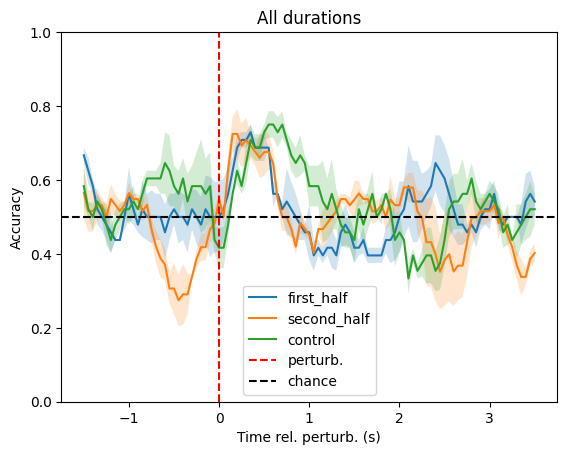

In [174]:
import scipy
errStat = scipy.stats.sem
fig, ax = plt.subplots()

for key, scores in scores_dict.items():
    vizutils.shaded_errorbar(ax, time_points/100, scores, errorStat=errStat, label=key)
ax.axvline(x=0, color='r', linestyle='dashed', label='perturb.')
ax.axhline(y=1/2, color='k', linestyle='dashed', label='chance')
ax.set_xlabel('Time rel. perturb. (s)')
ax.set_ylabel('Accuracy')
ax.set_title('All durations')
ax.set_ylim(0, 1)
ax.legend()

## testing isomap again?

In [2]:
session = "M062_2025_03_20_14_00"
handler = decode.DecodingDataHandler(data_dir='/data/bnd-data/raw/', session=session, combine_time_bins=True)


field values_before_camera_trigger could not be converted to int.
field idx_before_camera_trigger could not be converted to int.
array field SSp_KSLabel could not be converted to int.
array field VAL_KSLabel could not be converted to int.
array field all_KSLabel could not be converted to int.
array field CP_KSLabel could not be converted to int.
array field MOp_KSLabel could not be converted to int.
field values_Sol_direction could not be converted to int.
field idx_Sol_direction could not be converted to int.
field values_Sol_duration could not be converted to int.
field idx_Sol_duration could not be converted to int.
field idx_sol_on could not be converted to int.
array field SSp_KSLabel could not be converted to int.
array field VAL_KSLabel could not be converted to int.
array field all_KSLabel could not be converted to int.
array field CP_KSLabel could not be converted to int.
array field MOp_KSLabel could not be converted to int.
array field SSp_KSLabel could not be converted to i

/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: values_MotSen1_X might be a time-varying field. It matches the length of SSp_spikes on 99.85955056179775% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: idx_MotSen1_X might be a time-varying field. It matches the length of SSp_spikes on 99.85955056179775% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: values_MotSen1_Y might be a time-varying field. It matches the length of SSp_spikes on 99.85955056179775% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: idx_MotSen1_Y might be a time-varying field. It matches the length of SSp_spikes on 99.85955056179775% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/

Combined every 3 bins
Resulting SSp_spikes ephys data shape is (NxT): (118, 16000)
Resulting VAL_spikes ephys data shape is (NxT): (155, 16000)
Resulting all_spikes ephys data shape is (NxT): (34, 16000)
Resulting CP_spikes ephys data shape is (NxT): (356, 16000)
Resulting MOp_spikes ephys data shape is (NxT): (163, 16000)


In [3]:
tmp_df = pyal.select_trials(handler.df, handler.df.trial_name == 'trial')
WINDOW_perturb_long = (-1, 3)
perturb_epoch_long = pyal.generate_epoch_fun(
    start_point_name="idx_sol_on",
    rel_start=int(WINDOW_perturb_long[0] / 0.03),
    rel_end=int(WINDOW_perturb_long[1] / 0.03),
)
tmp_df = pyal.restrict_to_interval(tmp_df, epoch_fun=perturb_epoch_long)

/tmp/ipykernel_1309874/3075730684.py:8: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [710]
  tmp_df = pyal.restrict_to_interval(tmp_df, epoch_fun=perturb_epoch_long)


In [4]:
rates = np.concatenate(tmp_df.MOp_rates.values)
rates.shape

(47436, 163)

In [ ]:
from tools.dimensionality.participation import get_pr_for_subsets_of_neurons


isomap_pr = get_pr_for_subsets_of_neurons(
    rates[:15000, :],
    niter=5,
    linear=False,
    n_neighbors=10,
    verbose=True,
)

Neurons: 5
	0


## RRR during trials?

In [3]:
handler = decode.DecodingDataHandler(data_dir='/data/bnd-data/raw/', 
                                     session='M061_2025_03_06_14_00',
                                     combine_time_bins=True)

field values_before_camera_trigger could not be converted to int.
field idx_before_camera_trigger could not be converted to int.
array field all_KSLabel could not be converted to int.
array field SSp_KSLabel could not be converted to int.
array field VAL_KSLabel could not be converted to int.
array field GPe_KSLabel could not be converted to int.
array field CP_KSLabel could not be converted to int.
array field MOp_KSLabel could not be converted to int.
array field all_KSLabel could not be converted to int.
array field SSp_KSLabel could not be converted to int.
array field VAL_KSLabel could not be converted to int.
array field GPe_KSLabel could not be converted to int.
array field CP_KSLabel could not be converted to int.
array field MOp_KSLabel could not be converted to int.


/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: values_MotSen1_X might be a time-varying field. It matches the length of all_spikes on 99.85052316890882% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: idx_MotSen1_X might be a time-varying field. It matches the length of all_spikes on 99.85052316890882% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: values_MotSen1_Y might be a time-varying field. It matches the length of all_spikes on 99.85052316890882% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: idx_MotSen1_Y might be a time-varying field. It matches the length of all_spikes on 99.85052316890882% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/

Combined every 3 bins
Resulting all_spikes ephys data shape is (NxT): (11, 20000)
Resulting SSp_spikes ephys data shape is (NxT): (69, 20000)
Resulting VAL_spikes ephys data shape is (NxT): (168, 20000)
Resulting GPe_spikes ephys data shape is (NxT): (120, 20000)
Resulting CP_spikes ephys data shape is (NxT): (172, 20000)
Resulting MOp_spikes ephys data shape is (NxT): (178, 20000)


In [544]:
kinematics_for_decoding = ['right_ankle']


data, kinematics = handler.get_data_and_kinematics(
        condition='trial', 
        kinematics=kinematics_for_decoding, 
        epoch=(-2, 3.5),
        area='VAL'
    )

In [545]:
from tools.decoding.lstm_tools.preprocess import baseline_norm_labels

kf = KFold(n_splits=2, shuffle=True)
speed = np.expand_dims(np.linalg.norm(kinematics, axis=-1), axis=-1)

for fold, (train_index, test_index) in enumerate(kf.split(data)):
    X_train, X_test = data[train_index], data[test_index]
    Y_train, Y_test = kinematics[train_index], kinematics[test_index]

    # Y_train, Y_test = baseline_norm_labels(Y_train, Y_test)

    n_trials_test, n_timepoints, n_kine_feat = Y_test.shape

    X_train, Y_train = X_train.reshape(-1, data.shape[-1]), Y_train.reshape(-1, kinematics.shape[-1])
    X_test, Y_test = X_test.reshape(-1, data.shape[-1]), Y_test.reshape(-1, kinematics.shape[-1])
    
    
    model = decode.rrr.ReducedRankRegression(r=10, lam=0.01, use_sklearn=False, verbose=False)

    model.fit(X=X_train, Y=Y_train)

    Y_pred_test = model.predict(X_test)

    r2 = r2_score(y_true=Y_test, y_pred=Y_pred_test, multioutput='variance_weighted')
    print(f'Fold: {fold}. R2: {r2}')



Fold: 0. R2: 0.35871285841890954
Fold: 1. R2: 0.33886068945518044


In [535]:
def add_history_to_trials(data, n_hist=5):
    newShape = list(data.shape)
    newShape[-1] *= n_hist + 1
    out = np.empty(newShape)

    for trial_idx, trial in enumerate(data):
        out[trial_idx, :, :] = dt.add_history(trial, n_hist=n_hist)

    return out


In [536]:
n_trials_test, n_timepoints, n_kine_feat

(90, 183, 3)

In [546]:
Y_pred_test_original = Y_pred_test.reshape(n_trials_test, n_timepoints, n_kine_feat)
Y_test_original = Y_test.reshape(n_trials_test, n_timepoints, n_kine_feat)

In [547]:
rmse_trial_time = np.sqrt(np.mean((Y_test_original - Y_pred_test_original)**2, axis=2))
norm_rmse_trial_time = rmse_trial_time - np.mean(rmse_trial_time[:, :66])
norm_rmse_trial_time_val = norm_rmse_trial_time

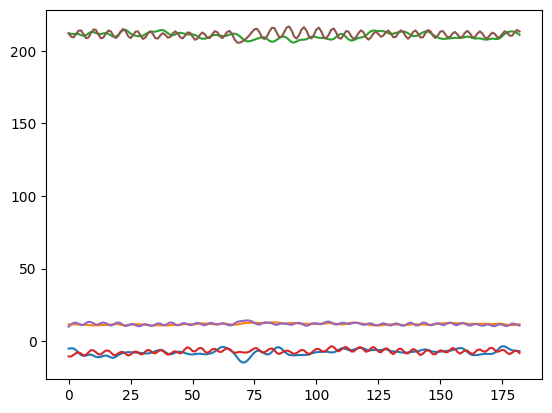

In [548]:
plt.plot(Y_pred_test_original[0, :])
plt.plot(Y_test_original[0, :])

Text(0.5, 0, 'Time')

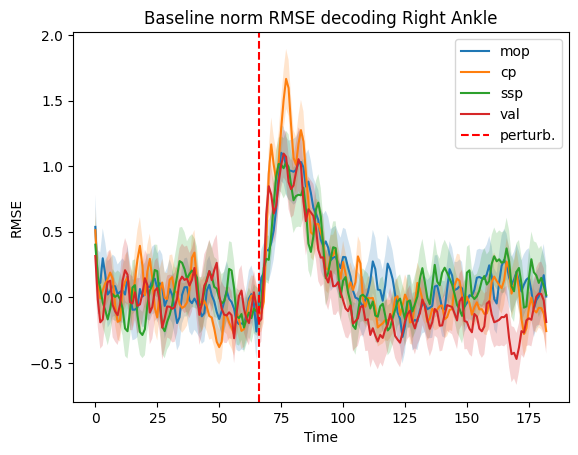

In [552]:
fig, ax = plt.subplots()
errorStat = scipy.stats.sem
vizutils.shaded_errorbar(ax, norm_rmse_trial_time_mop.T, errorStat=errorStat, label='mop')
vizutils.shaded_errorbar(ax, norm_rmse_trial_time_cp.T, errorStat=errorStat, label='cp')
vizutils.shaded_errorbar(ax, norm_rmse_trial_time_ssp.T, errorStat=errorStat, label='ssp')
vizutils.shaded_errorbar(ax, norm_rmse_trial_time_val.T, errorStat=errorStat, label='val')
ax.axvline(x=66, color='r', linestyle='dashed', label='perturb.')
ax.legend()
ax.set_title('Baseline norm RMSE decoding Right Ankle')
ax.set_ylabel('RMSE')
ax.set_xlabel('Time')

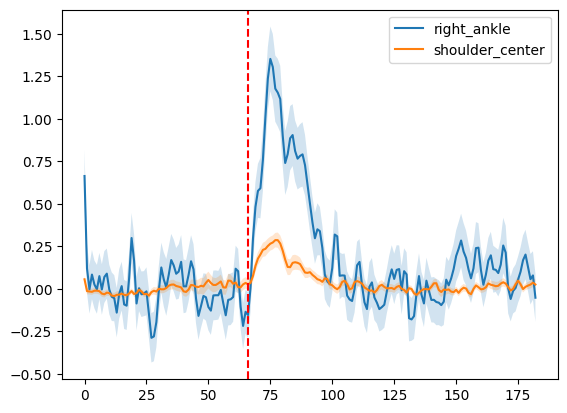

In [431]:
fig, ax = plt.subplots()
errorStat = scipy.stats.sem
vizutils.shaded_errorbar(ax, norm_rmse_trial_time_right_ankle.T, errorStat=errorStat, label='right_ankle')
vizutils.shaded_errorbar(ax, norm_rmse_trial_time_shoulder.T, errorStat=errorStat, label='shoulder_center')
ax.axvline(x=66, color='r', linestyle='dashed')
ax.legend()

### One model per window

In [553]:
handler = decode.DecodingDataHandler(data_dir='/data/bnd-data/raw/', 
                                     session='M061_2025_03_06_14_00',
                                     combine_time_bins=True)

field values_before_camera_trigger could not be converted to int.
field idx_before_camera_trigger could not be converted to int.
array field all_KSLabel could not be converted to int.
array field SSp_KSLabel could not be converted to int.
array field VAL_KSLabel could not be converted to int.
array field GPe_KSLabel could not be converted to int.
array field CP_KSLabel could not be converted to int.
array field MOp_KSLabel could not be converted to int.
array field all_KSLabel could not be converted to int.
array field SSp_KSLabel could not be converted to int.
array field VAL_KSLabel could not be converted to int.
array field GPe_KSLabel could not be converted to int.
array field CP_KSLabel could not be converted to int.
array field MOp_KSLabel could not be converted to int.


/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: values_MotSen1_X might be a time-varying field. It matches the length of all_spikes on 99.85052316890882% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: idx_MotSen1_X might be a time-varying field. It matches the length of all_spikes on 99.85052316890882% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: values_MotSen1_Y might be a time-varying field. It matches the length of all_spikes on 99.85052316890882% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: idx_MotSen1_Y might be a time-varying field. It matches the length of all_spikes on 99.85052316890882% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/

Combined every 3 bins
Resulting all_spikes ephys data shape is (NxT): (11, 20000)
Resulting SSp_spikes ephys data shape is (NxT): (69, 20000)
Resulting VAL_spikes ephys data shape is (NxT): (168, 20000)
Resulting GPe_spikes ephys data shape is (NxT): (120, 20000)
Resulting CP_spikes ephys data shape is (NxT): (172, 20000)
Resulting MOp_spikes ephys data shape is (NxT): (178, 20000)


In [ ]:
kinematics_for_decoding = ['right_ankle']


data, kinematics = handler.get_data_and_kinematics(
        condition='trial', 
        kinematics=kinematics_for_decoding, 
        epoch=(-2, 3.5),
        area='MOp'
    )

In [48]:
bin_size = 0.03

min_time_bin = int(-2 / bin_size)
max_time_bin= int(3.5 / bin_size)

window_length_bin = int(0.6 / bin_size)

kf = KFold(n_splits=5, shuffle=True)

y_preds = []
y_trues = []

for t in np.arange(max_time_bin - min_time_bin + 1 - window_length_bin, step=window_length_bin):
    print(f'Bin: {t} to {t+window_length_bin}')
    data_ = data[:, t:t+window_length_bin, :]  # n_trials, n_time, n_feat
    kinematics_ = kinematics[:, t:t+window_length_bin, :] # n_trials, n_time, n_feat

    y_preds_per_window = []
    y_trues_per_window = []


    for fold, (train_index, test_index) in enumerate(kf.split(data_)):
        X_train, X_test = data_[train_index], data_[test_index]
        Y_train, Y_test = kinematics_[train_index], kinematics_[test_index]
        n_trials_test, n_timepoints, n_kine_feat = Y_test.shape

#         # Y_train, Y_test = baseline_norm_labels(Y_train, Y_test)

        X_train, Y_train = X_train.reshape(-1, data_.shape[-1]), Y_train.reshape(-1, kinematics_.shape[-1])
        X_test, Y_test = X_test.reshape(-1, data_.shape[-1]), Y_test.reshape(-1, kinematics_.shape[-1])
        
        
        model = decode.rrr.ReducedRankRegression(r=10, lam=0.01, use_sklearn=False, verbose=False)
        model.fit(X=X_train, Y=Y_train)
        y_pred = model.predict(X_test)

        y_pred_original = y_pred.reshape(n_trials_test, n_timepoints, n_kine_feat)
        y_test_original = Y_test.reshape(n_trials_test, n_timepoints, n_kine_feat)

        y_preds_per_window.append(y_pred_original)
        y_trues_per_window.append(y_test_original)

#         r2 = r2_score(y_true=Y_test, y_pred=Y_pred_test, multioutput='variance_weighted')
#         print(f'Fold: {fold}. R2: {r2}')

    y_preds.append(np.concatenate(y_preds_per_window))
    y_trues.append(np.concatenate(y_trues_per_window))

y_trues = np.array(y_trues)
y_preds = np.array(y_preds)

Bin: 0 to 20
Bin: 20 to 40
Bin: 40 to 60
Bin: 60 to 80
Bin: 80 to 100
Bin: 100 to 120
Bin: 120 to 140
Bin: 140 to 160
Bin: 160 to 180


In [49]:
rmse_per_window = []
for window_trues, window_preds in zip(y_trues, y_preds):
    rmse_trial_time = np.sqrt(np.mean((window_trues - window_preds)**2, axis=2))
    rmse_per_window.append(rmse_trial_time)

rmse_per_window = np.hstack(rmse_per_window)  
norm_rmse_per_window = rmse_per_window - np.mean(rmse_per_window[:, :66])


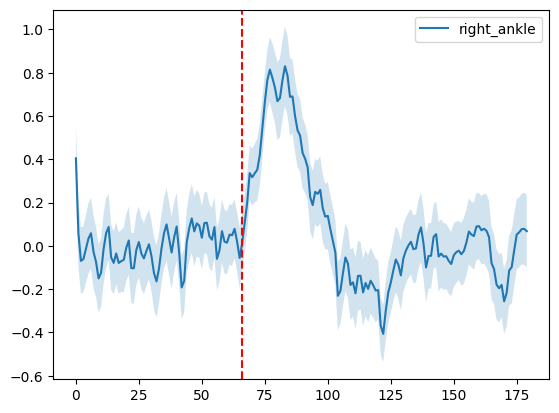

In [46]:
import scipy
fig, ax = plt.subplots()
errorStat = scipy.stats.sem
vizutils.shaded_errorbar(ax, norm_rmse_per_window.T, errorStat=errorStat, label='right_ankle')
ax.axvline(x=66, color='r', linestyle='dashed')
ax.legend()

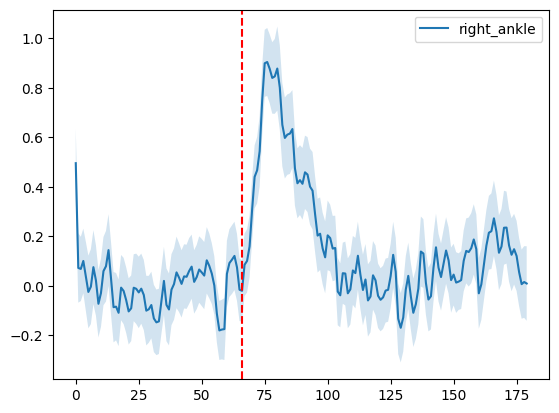

In [50]:
import scipy
fig, ax = plt.subplots()
errorStat = scipy.stats.sem
vizutils.shaded_errorbar(ax, norm_rmse_per_window.T, errorStat=errorStat, label='right_ankle')
ax.axvline(x=66, color='r', linestyle='dashed')
ax.legend()

 77%|███████▋  | 20/26 [05:19<01:36, 16.05s/it]/tmp/ipykernel_80781/1587627007.py:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()
100%|██████████| 26/26 [06:55<00:00, 15.99s/it]


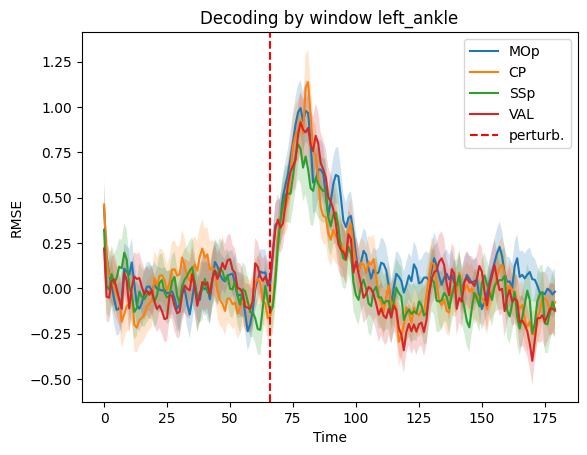

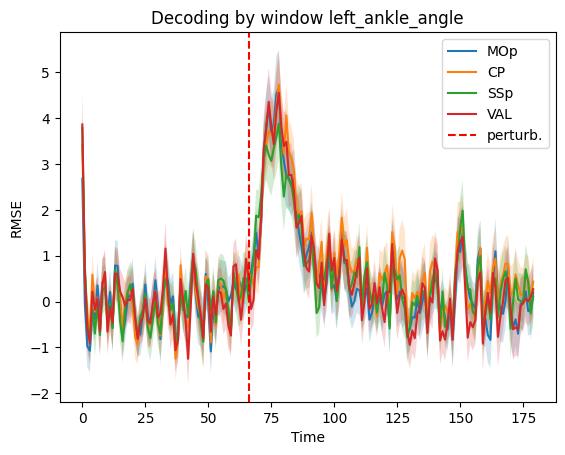

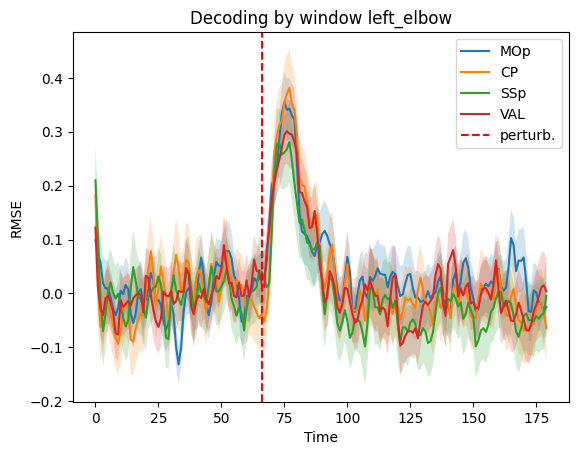

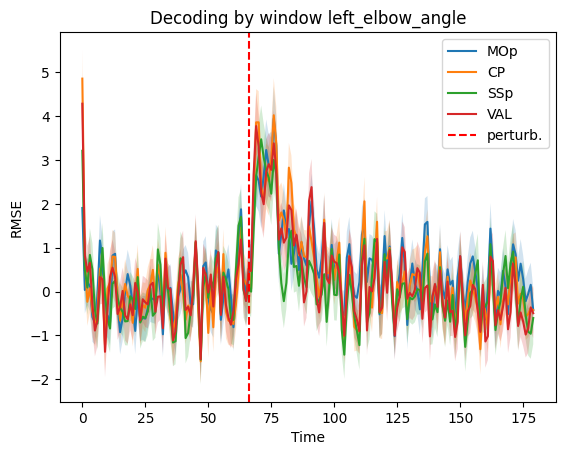

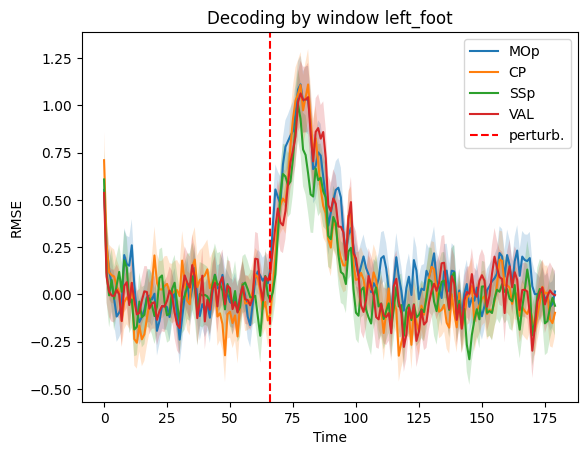

...

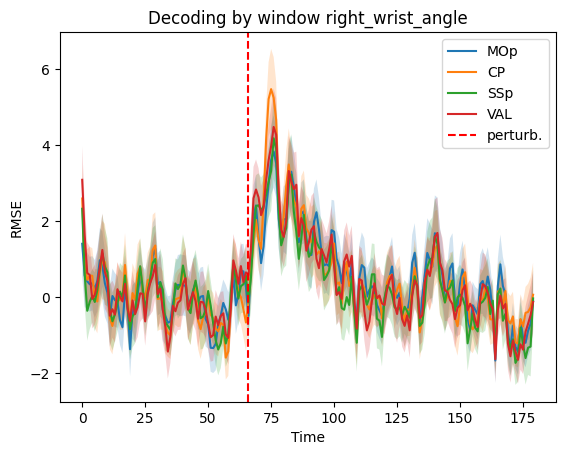

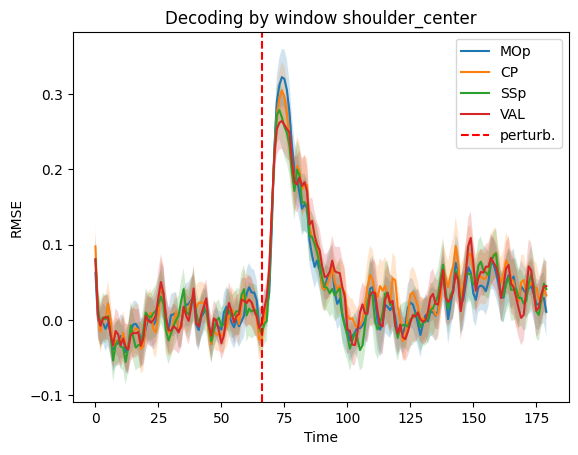

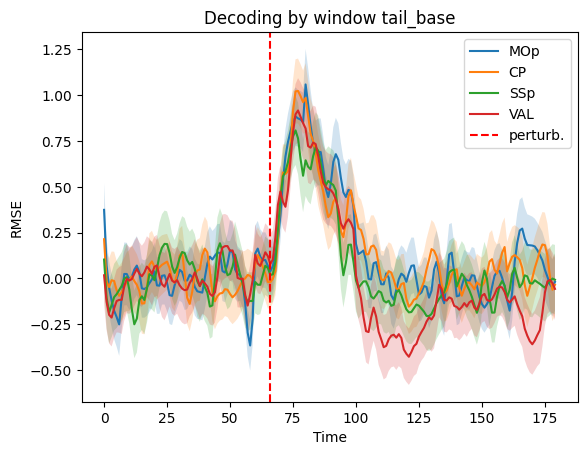

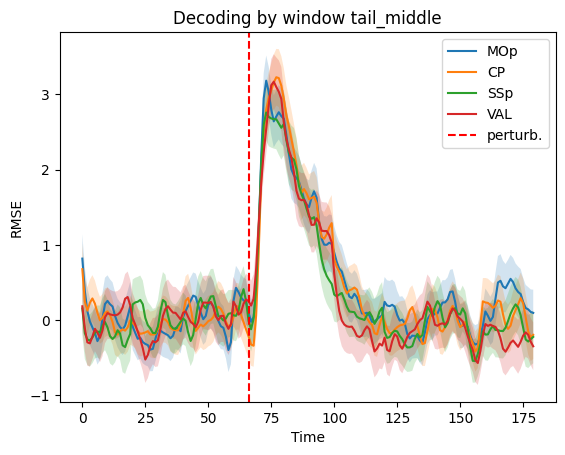

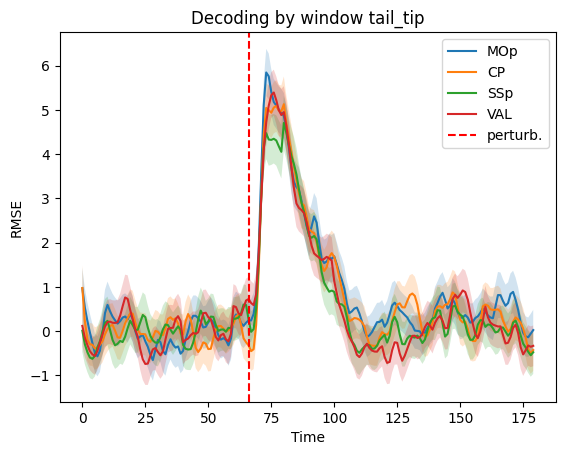

In [60]:
errorStat = scipy.stats.sem
from tools.decoding.lstm_tools.preprocess import baseline_norm_labels
keypoints = ['left_ankle', 'left_ankle_angle', 'left_elbow', 'left_elbow_angle',
       'left_foot', 'left_knee', 'left_knee_angle', 'left_paw',
       'left_shoulder', 'left_wrist', 'left_wrist_angle', 'right_ankle',
       'right_ankle_angle', 'right_elbow', 'right_elbow_angle', 'right_foot',
       'right_knee', 'right_knee_angle', 'right_paw', 'right_shoulder',
       'right_wrist', 'right_wrist_angle', 'shoulder_center', 'tail_base',
       'tail_middle', 'tail_tip']

for keypoint in tqdm(keypoints):
    fig, ax = plt.subplots()

    for area in ['MOp', 'CP', 'SSp', 'VAL']:
        kinematics_for_decoding = ['right_ankle']


        data, kinematics = handler.get_data_and_kinematics(
                condition='trial', 
                kinematics=[keypoint], 
                epoch=(-2, 3.5),
                area=area
            )
        
        bin_size = 0.03

        min_time_bin = int(-2 / bin_size)
        max_time_bin= int(3.5 / bin_size)

        window_length_bin = int(0.6 / bin_size)

        kf = KFold(n_splits=5, shuffle=True)

        y_preds = []
        y_trues = []

        for t in np.arange(max_time_bin - min_time_bin + 1 - window_length_bin, step=window_length_bin):
            data_ = data[:, t:t+window_length_bin, :]  # n_trials, n_time, n_feat
            kinematics_ = kinematics[:, t:t+window_length_bin, :] # n_trials, n_time, n_feat

            y_preds_per_window = []
            y_trues_per_window = []


            for fold, (train_index, test_index) in enumerate(kf.split(data_)):
                X_train, X_test = data_[train_index], data_[test_index]
                Y_train, Y_test = kinematics_[train_index], kinematics_[test_index]
                n_trials_test, n_timepoints, n_kine_feat = Y_test.shape

                Y_train, Y_test = baseline_norm_labels(Y_train, Y_test)

                X_train, Y_train = X_train.reshape(-1, data_.shape[-1]), Y_train.reshape(-1, kinematics_.shape[-1])
                X_test, Y_test = X_test.reshape(-1, data_.shape[-1]), Y_test.reshape(-1, kinematics_.shape[-1])
                
                
                model = decode.rrr.ReducedRankRegression(r=10, lam=0.01, use_sklearn=False, verbose=False)
                model.fit(X=X_train, Y=Y_train)
                y_pred = model.predict(X_test)

                y_pred_original = y_pred.reshape(n_trials_test, n_timepoints, n_kine_feat)
                y_test_original = Y_test.reshape(n_trials_test, n_timepoints, n_kine_feat)

                y_preds_per_window.append(y_pred_original)
                y_trues_per_window.append(y_test_original)

        #         r2 = r2_score(y_true=Y_test, y_pred=Y_pred_test, multioutput='variance_weighted')
        #         print(f'Fold: {fold}. R2: {r2}')

            y_preds.append(np.concatenate(y_preds_per_window))
            y_trues.append(np.concatenate(y_trues_per_window))

        y_trues = np.array(y_trues)
        y_preds = np.array(y_preds)

        rmse_per_window = []
        for window_trues, window_preds in zip(y_trues, y_preds):
            rmse_trial_time = np.sqrt(np.mean((window_trues - window_preds)**2, axis=2))
            rmse_per_window.append(rmse_trial_time)

        rmse_per_window = np.hstack(rmse_per_window)  
        norm_rmse_per_window = rmse_per_window - np.mean(rmse_per_window[:, :66])

        
        vizutils.shaded_errorbar(ax, norm_rmse_per_window.T, errorStat=errorStat, label=area)
    ax.set_ylabel('RMSE')
    ax.set_xlabel('Time')
    ax.set_title(f'Decoding by window {keypoint}')
    ax.axvline(x=66, color='r', linestyle='dashed', label='perturb.')
    ax.legend()



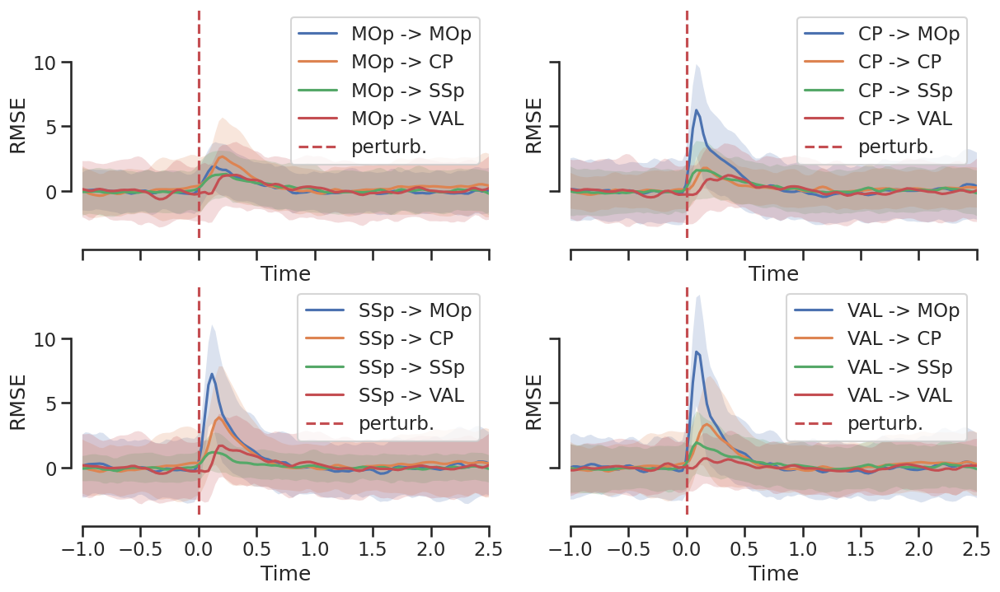

In [105]:
errorStat = np.std
from tools.decoding.lstm_tools.preprocess import baseline_norm_labels
areas = ['MOp', 'CP', 'SSp', 'VAL']
times = np.linspace(-2, 3.5, num=183)
with vizutils.apply_plot_style():
    fig, axes = plt.subplots(2, 2, figsize=(14, 8), sharex='all', sharey='all')

    for area_x, ax in zip(areas[:], axes.ravel()[:]):
        data = handler.get_data_and_kinematics(
                    condition='trial', 
                    epoch=(-2, 3.5),
                    area=area_x
                )
        
        for area_y in areas[:]:
            
            labels = handler.get_data_and_kinematics(
                    condition='trial', 
                    epoch=(-2, 3.5),
                    area=area_y
                )
            

            y_preds = []
            y_trues = []

            for fold, (train_index, test_index) in enumerate(kf.split(data)):
                X_train, X_test = data[train_index], data[test_index]
                Y_train, Y_test = labels[train_index], labels[test_index]
                n_trials_test, n_timepoints, n_kine_feat = Y_test.shape


                X_train, Y_train = X_train.reshape(-1, data.shape[-1]), Y_train.reshape(-1, labels.shape[-1])
                X_test, Y_test = X_test.reshape(-1, data.shape[-1]), Y_test.reshape(-1, labels.shape[-1])
                    
                    
                model = decode.rrr.ReducedRankRegression(r=10, lam=0.01, use_sklearn=False, verbose=False)
                model.fit(X=X_train, Y=Y_train)
                y_pred = model.predict(X_test)

                y_pred_original = y_pred.reshape(n_trials_test, n_timepoints, n_kine_feat)
                y_test_original = Y_test.reshape(n_trials_test, n_timepoints, n_kine_feat)

                y_preds.append(y_pred_original)
                y_trues.append(y_test_original)

            y_preds = np.concatenate(y_preds)
            y_trues = np.concatenate(y_trues)


            rmse_trial_time = np.sqrt(np.mean((y_trues - y_preds)**2, axis=2))
            norm_rmse_trial_time = rmse_trial_time - np.mean(rmse_trial_time[:, :66])

            vizutils.shaded_errorbar(ax, times, norm_rmse_trial_time.T, errorStat=errorStat, label=f'{area_x} -> {area_y}')
        ax.set_ylabel('RMSE')
        ax.set_xlabel('Time')
        ax.axvline(x=0, color='r', linestyle='dashed', label='perturb.')
        ax.set_xlim(-1, 2.5)
        ax.legend()



In [106]:
handler = decode.DecodingDataHandler(data_dir='/data/bnd-data/raw/', 
                                     session='M061_2025_03_05_14_00',
                                     combine_time_bins=True)

field values_before_camera_trigger could not be converted to int.
field idx_before_camera_trigger could not be converted to int.
array field SSp_KSLabel could not be converted to int.
array field all_KSLabel could not be converted to int.
array field VAL_KSLabel could not be converted to int.
array field GPe_KSLabel could not be converted to int.
array field MOp_KSLabel could not be converted to int.
array field CP_KSLabel could not be converted to int.
field idx_motion could not be converted to int.
array field SSp_KSLabel could not be converted to int.
array field all_KSLabel could not be converted to int.
array field VAL_KSLabel could not be converted to int.
array field GPe_KSLabel could not be converted to int.
array field MOp_KSLabel could not be converted to int.
array field CP_KSLabel could not be converted to int.


/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: values_MotSen1_X might be a time-varying field. It matches the length of SSp_spikes on 99.84871406959152% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: idx_MotSen1_X might be a time-varying field. It matches the length of SSp_spikes on 99.84871406959152% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: values_MotSen1_Y might be a time-varying field. It matches the length of SSp_spikes on 99.84871406959152% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: idx_MotSen1_Y might be a time-varying field. It matches the length of SSp_spikes on 99.84871406959152% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/

Combined every 3 bins
Resulting SSp_spikes ephys data shape is (NxT): (118, 20000)
Resulting all_spikes ephys data shape is (NxT): (24, 20000)
Resulting VAL_spikes ephys data shape is (NxT): (219, 20000)
Resulting GPe_spikes ephys data shape is (NxT): (100, 20000)
Resulting MOp_spikes ephys data shape is (NxT): (155, 20000)
Resulting CP_spikes ephys data shape is (NxT): (195, 20000)


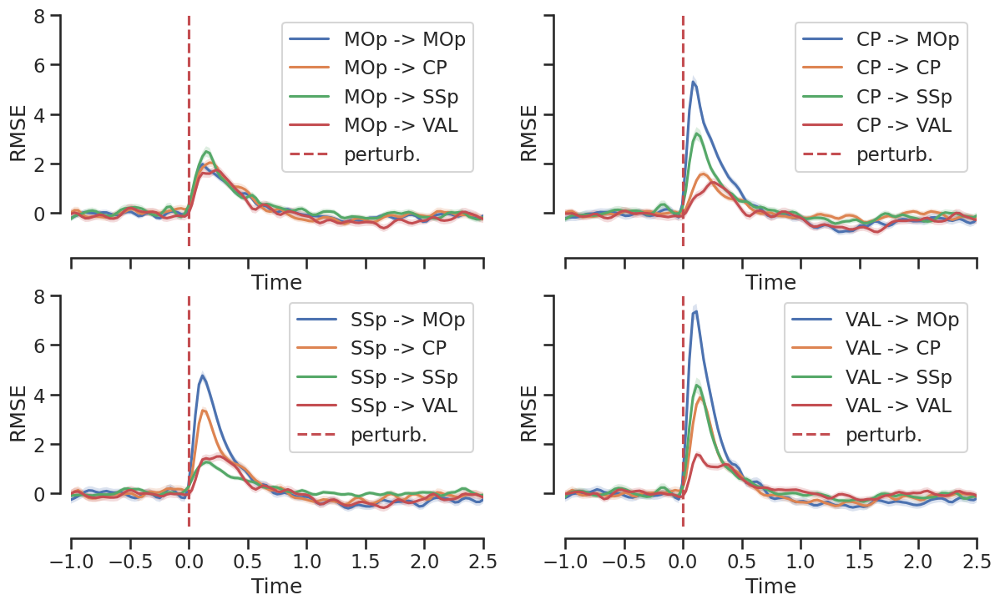

In [107]:
errorStat = scipy.stats.sem
areas = ['MOp', 'CP', 'SSp', 'VAL']
times = np.linspace(-2, 3.5, num=183)
with vizutils.apply_plot_style():
    fig, axes = plt.subplots(2, 2, figsize=(14, 8), sharex='all', sharey='all')

    for area_x, ax in zip(areas[:], axes.ravel()[:]):
        data = handler.get_data_and_kinematics(
                    condition='trial', 
                    epoch=(-2, 3.5),
                    area=area_x
                )
        
        for area_y in areas[:]:
            
            labels = handler.get_data_and_kinematics(
                    condition='trial', 
                    epoch=(-2, 3.5),
                    area=area_y
                )
            

            y_preds = []
            y_trues = []

            for fold, (train_index, test_index) in enumerate(kf.split(data)):
                X_train, X_test = data[train_index], data[test_index]
                Y_train, Y_test = labels[train_index], labels[test_index]
                n_trials_test, n_timepoints, n_kine_feat = Y_test.shape


                X_train, Y_train = X_train.reshape(-1, data.shape[-1]), Y_train.reshape(-1, labels.shape[-1])
                X_test, Y_test = X_test.reshape(-1, data.shape[-1]), Y_test.reshape(-1, labels.shape[-1])
                    
                    
                model = decode.rrr.ReducedRankRegression(r=10, lam=0.01, use_sklearn=False, verbose=False)
                model.fit(X=X_train, Y=Y_train)
                y_pred = model.predict(X_test)

                y_pred_original = y_pred.reshape(n_trials_test, n_timepoints, n_kine_feat)
                y_test_original = Y_test.reshape(n_trials_test, n_timepoints, n_kine_feat)

                y_preds.append(y_pred_original)
                y_trues.append(y_test_original)

            y_preds = np.concatenate(y_preds)
            y_trues = np.concatenate(y_trues)


            rmse_trial_time = np.sqrt(np.mean((y_trues - y_preds)**2, axis=2))
            norm_rmse_trial_time = rmse_trial_time - np.mean(rmse_trial_time[:, :66])

            vizutils.shaded_errorbar(ax, times, norm_rmse_trial_time.T, errorStat=errorStat, label=f'{area_x} -> {area_y}')
        ax.set_ylabel('RMSE')
        ax.set_xlabel('Time')
        ax.axvline(x=0, color='r', linestyle='dashed', label='perturb.')
        ax.set_xlim(-1, 2.5)
        ax.legend()



field values_before_camera_trigger could not be converted to int.
field idx_before_camera_trigger could not be converted to int.
array field VAL_KSLabel could not be converted to int.
array field SSp_KSLabel could not be converted to int.
array field all_KSLabel could not be converted to int.
array field CP_KSLabel could not be converted to int.
array field MOp_KSLabel could not be converted to int.
array field GPe_KSLabel could not be converted to int.
field idx_motion could not be converted to int.
array field VAL_KSLabel could not be converted to int.
array field SSp_KSLabel could not be converted to int.
array field all_KSLabel could not be converted to int.
array field CP_KSLabel could not be converted to int.
array field MOp_KSLabel could not be converted to int.
array field GPe_KSLabel could not be converted to int.
field values_Sol_direction could not be converted to int.
field idx_Sol_direction could not be converted to int.
field values_Sol_duration could not be converted to 

/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: values_MotSen1_X might be a time-varying field. It matches the length of VAL_spikes on 99.8529411764706% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: idx_MotSen1_X might be a time-varying field. It matches the length of VAL_spikes on 99.8529411764706% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: values_MotSen1_Y might be a time-varying field. It matches the length of VAL_spikes on 99.8529411764706% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: idx_MotSen1_Y might be a time-varying field. It matches the length of VAL_spikes on 99.8529411764706% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyal

Combined every 3 bins
Resulting VAL_spikes ephys data shape is (NxT): (240, 20000)
Resulting SSp_spikes ephys data shape is (NxT): (59, 20000)
Resulting all_spikes ephys data shape is (NxT): (53, 20000)
Resulting CP_spikes ephys data shape is (NxT): (225, 20000)
Resulting MOp_spikes ephys data shape is (NxT): (206, 20000)
Resulting GPe_spikes ephys data shape is (NxT): (112, 20000)


/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:27: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [678]
  df = pyal.restrict_to_interval(df, epoch_fun=epoch)
/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:18: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [678]
  df = pyal.restrict_to_interval(df, epoch_fun=epoch)
/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:147: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [678]
  df_ = pyal.restrict_to_interval(df, epoch_fun=epoch) if epoch is not None else df
/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:27: UserWarnin

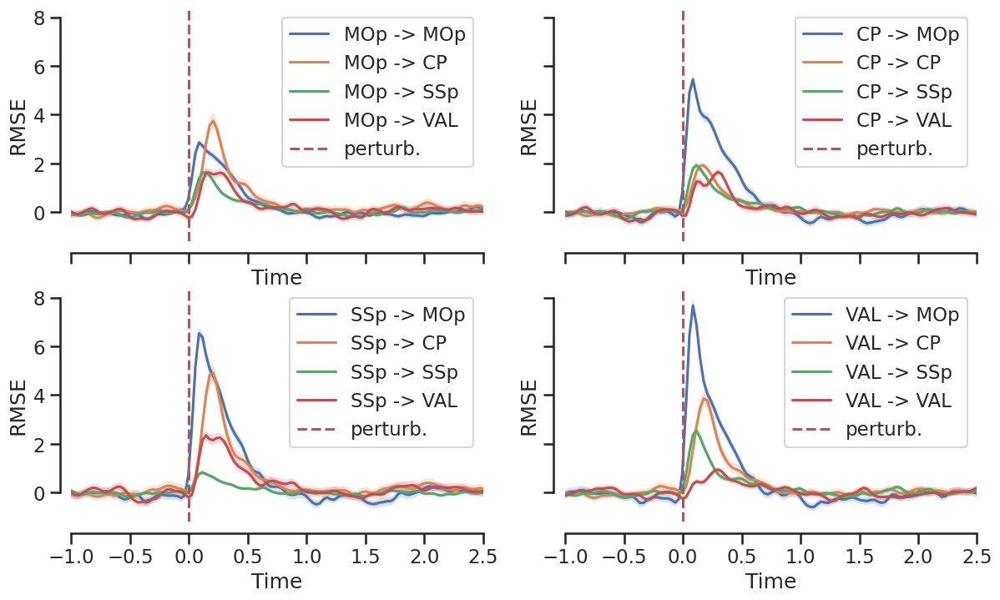

In [108]:
handler = decode.DecodingDataHandler(data_dir='/data/bnd-data/raw/', 
                                     session='M061_2025_03_04_10_00',
                                     combine_time_bins=True)

errorStat = scipy.stats.sem
areas = ['MOp', 'CP', 'SSp', 'VAL']
times = np.linspace(-2, 3.5, num=183)
with vizutils.apply_plot_style():
    fig, axes = plt.subplots(2, 2, figsize=(14, 8), sharex='all', sharey='all')

    for area_x, ax in zip(areas[:], axes.ravel()[:]):
        data = handler.get_data_and_kinematics(
                    condition='trial', 
                    epoch=(-2, 3.5),
                    area=area_x
                )
        
        for area_y in areas[:]:
            
            labels = handler.get_data_and_kinematics(
                    condition='trial', 
                    epoch=(-2, 3.5),
                    area=area_y
                )
            

            y_preds = []
            y_trues = []

            for fold, (train_index, test_index) in enumerate(kf.split(data)):
                X_train, X_test = data[train_index], data[test_index]
                Y_train, Y_test = labels[train_index], labels[test_index]
                n_trials_test, n_timepoints, n_kine_feat = Y_test.shape


                X_train, Y_train = X_train.reshape(-1, data.shape[-1]), Y_train.reshape(-1, labels.shape[-1])
                X_test, Y_test = X_test.reshape(-1, data.shape[-1]), Y_test.reshape(-1, labels.shape[-1])
                    
                    
                model = decode.rrr.ReducedRankRegression(r=10, lam=0.01, use_sklearn=False, verbose=False)
                model.fit(X=X_train, Y=Y_train)
                y_pred = model.predict(X_test)

                y_pred_original = y_pred.reshape(n_trials_test, n_timepoints, n_kine_feat)
                y_test_original = Y_test.reshape(n_trials_test, n_timepoints, n_kine_feat)

                y_preds.append(y_pred_original)
                y_trues.append(y_test_original)

            y_preds = np.concatenate(y_preds)
            y_trues = np.concatenate(y_trues)


            rmse_trial_time = np.sqrt(np.mean((y_trues - y_preds)**2, axis=2))
            norm_rmse_trial_time = rmse_trial_time - np.mean(rmse_trial_time[:, :66])

            vizutils.shaded_errorbar(ax, times, norm_rmse_trial_time.T, errorStat=errorStat, label=f'{area_x} -> {area_y}')
        ax.set_ylabel('RMSE')
        ax.set_xlabel('Time')
        ax.axvline(x=0, color='r', linestyle='dashed', label='perturb.')
        ax.set_xlim(-1, 2.5)
        ax.legend()



field values_before_camera_trigger could not be converted to int.
field idx_before_camera_trigger could not be converted to int.
array field all_KSLabel could not be converted to int.
array field VAL_KSLabel could not be converted to int.
array field SSp_KSLabel could not be converted to int.
array field MOp_KSLabel could not be converted to int.
array field CP_KSLabel could not be converted to int.
field idx_motion could not be converted to int.
array field all_KSLabel could not be converted to int.
array field VAL_KSLabel could not be converted to int.
array field SSp_KSLabel could not be converted to int.
array field MOp_KSLabel could not be converted to int.
array field CP_KSLabel could not be converted to int.
field values_Sol_direction could not be converted to int.
field idx_Sol_direction could not be converted to int.
field values_Sol_duration could not be converted to int.
field idx_Sol_duration could not be converted to int.
field idx_sol_on could not be converted to int.
arr

/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: values_MotSen1_X might be a time-varying field. It matches the length of all_spikes on 99.86149584487535% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: idx_MotSen1_X might be a time-varying field. It matches the length of all_spikes on 99.86149584487535% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: values_MotSen1_Y might be a time-varying field. It matches the length of all_spikes on 99.86149584487535% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: idx_MotSen1_Y might be a time-varying field. It matches the length of all_spikes on 99.86149584487535% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/

Combined every 3 bins
Resulting all_spikes ephys data shape is (NxT): (43, 16000)
Resulting VAL_spikes ephys data shape is (NxT): (188, 16000)
Resulting SSp_spikes ephys data shape is (NxT): (131, 16000)
Resulting MOp_spikes ephys data shape is (NxT): (197, 16000)
Resulting CP_spikes ephys data shape is (NxT): (408, 16000)


/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:27: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [720]
  df = pyal.restrict_to_interval(df, epoch_fun=epoch)
/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:18: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [720]
  df = pyal.restrict_to_interval(df, epoch_fun=epoch)
/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:147: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [720]
  df_ = pyal.restrict_to_interval(df, epoch_fun=epoch) if epoch is not None else df
/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:27: UserWarnin

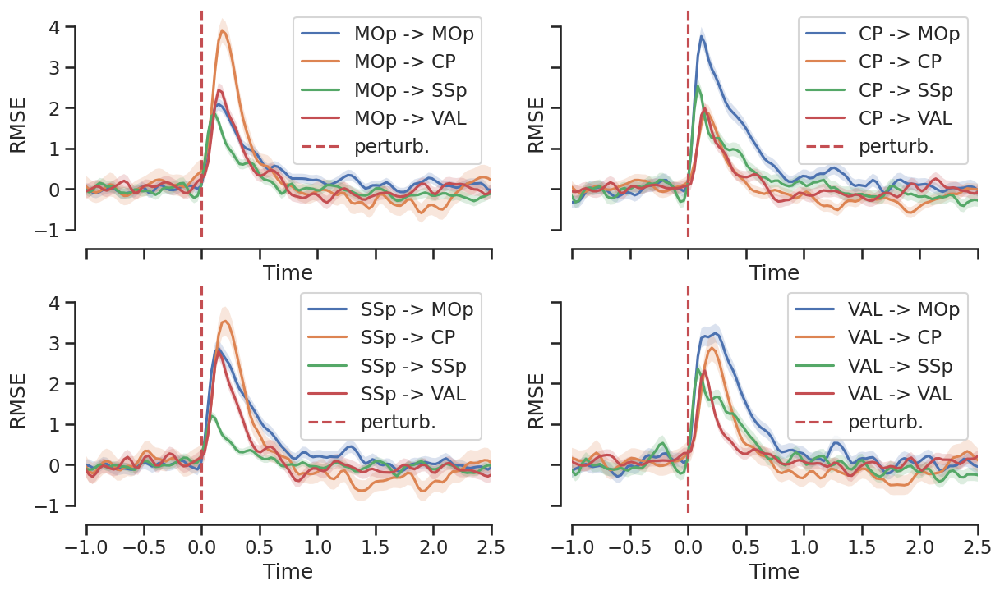

In [110]:
handler = decode.DecodingDataHandler(data_dir='/data/bnd-data/raw/', 
                                     session='M063_2025_03_13_14_00',
                                     combine_time_bins=True)

errorStat = scipy.stats.sem
areas = ['MOp', 'CP', 'SSp', 'VAL']
times = np.linspace(-2, 3.5, num=183)
with vizutils.apply_plot_style():
    fig, axes = plt.subplots(2, 2, figsize=(14, 8), sharex='all', sharey='all')

    for area_x, ax in zip(areas[:], axes.ravel()[:]):
        data = handler.get_data_and_kinematics(
                    condition='trial', 
                    epoch=(-2, 3.5),
                    area=area_x
                )
        
        for area_y in areas[:]:
            
            labels = handler.get_data_and_kinematics(
                    condition='trial', 
                    epoch=(-2, 3.5),
                    area=area_y
                )
            

            y_preds = []
            y_trues = []

            for fold, (train_index, test_index) in enumerate(kf.split(data)):
                X_train, X_test = data[train_index], data[test_index]
                Y_train, Y_test = labels[train_index], labels[test_index]
                n_trials_test, n_timepoints, n_kine_feat = Y_test.shape


                X_train, Y_train = X_train.reshape(-1, data.shape[-1]), Y_train.reshape(-1, labels.shape[-1])
                X_test, Y_test = X_test.reshape(-1, data.shape[-1]), Y_test.reshape(-1, labels.shape[-1])
                    
                    
                model = decode.rrr.ReducedRankRegression(r=10, lam=0.01, use_sklearn=False, verbose=False)
                model.fit(X=X_train, Y=Y_train)
                y_pred = model.predict(X_test)

                y_pred_original = y_pred.reshape(n_trials_test, n_timepoints, n_kine_feat)
                y_test_original = Y_test.reshape(n_trials_test, n_timepoints, n_kine_feat)

                y_preds.append(y_pred_original)
                y_trues.append(y_test_original)

            y_preds = np.concatenate(y_preds)
            y_trues = np.concatenate(y_trues)


            rmse_trial_time = np.sqrt(np.mean((y_trues - y_preds)**2, axis=2))
            norm_rmse_trial_time = rmse_trial_time - np.mean(rmse_trial_time[:, :66])

            vizutils.shaded_errorbar(ax, times, norm_rmse_trial_time.T, errorStat=errorStat, label=f'{area_x} -> {area_y}')
        ax.set_ylabel('RMSE')
        ax.set_xlabel('Time')
        ax.axvline(x=0, color='r', linestyle='dashed', label='perturb.')
        ax.set_xlim(-1, 2.5)
        ax.legend()



field values_before_camera_trigger could not be converted to int.
field idx_before_camera_trigger could not be converted to int.
array field VAL_KSLabel could not be converted to int.
array field SSp_KSLabel could not be converted to int.
array field all_KSLabel could not be converted to int.
array field CP_KSLabel could not be converted to int.
array field MOp_KSLabel could not be converted to int.
field idx_motion could not be converted to int.
field values_Sol_direction could not be converted to int.
field idx_Sol_direction could not be converted to int.
field values_Sol_duration could not be converted to int.
field idx_Sol_duration could not be converted to int.
field idx_sol_on could not be converted to int.
array field VAL_KSLabel could not be converted to int.
array field SSp_KSLabel could not be converted to int.
array field all_KSLabel could not be converted to int.
array field CP_KSLabel could not be converted to int.
array field MOp_KSLabel could not be converted to int.
fie

/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: values_MotSen1_X might be a time-varying field. It matches the length of VAL_spikes on 99.85228951255539% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: idx_MotSen1_X might be a time-varying field. It matches the length of VAL_spikes on 99.85228951255539% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: values_MotSen1_Y might be a time-varying field. It matches the length of VAL_spikes on 99.85228951255539% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: idx_MotSen1_Y might be a time-varying field. It matches the length of VAL_spikes on 99.85228951255539% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/

Combined every 3 bins
Resulting VAL_spikes ephys data shape is (NxT): (260, 20000)
Resulting SSp_spikes ephys data shape is (NxT): (92, 20000)
Resulting all_spikes ephys data shape is (NxT): (38, 20000)
Resulting CP_spikes ephys data shape is (NxT): (329, 20000)
Resulting MOp_spikes ephys data shape is (NxT): (161, 20000)


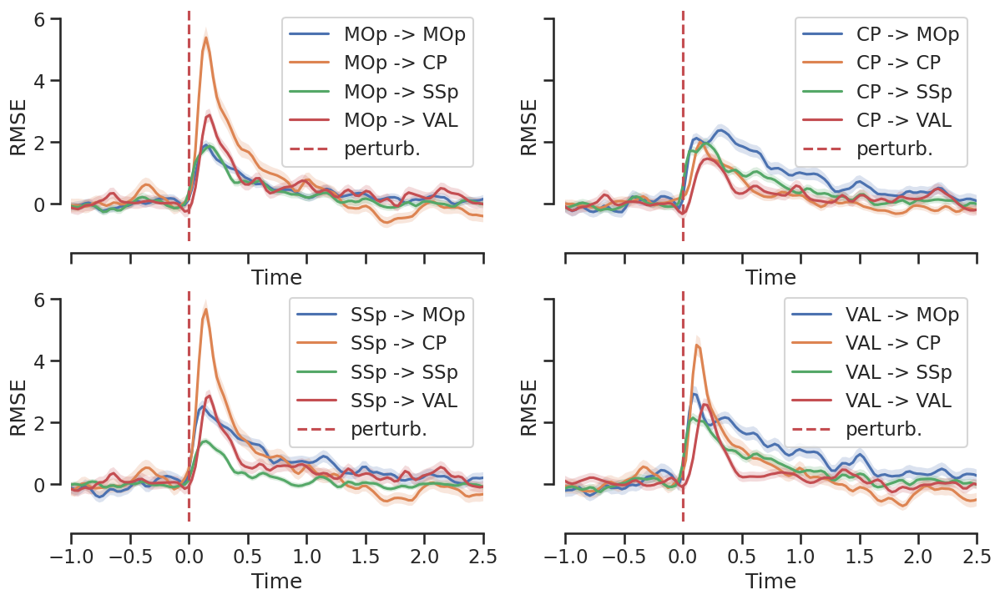

In [111]:
handler = decode.DecodingDataHandler(data_dir='/data/bnd-data/raw/', 
                                     session='M063_2025_03_14_15_30',
                                     combine_time_bins=True)

errorStat = scipy.stats.sem
areas = ['MOp', 'CP', 'SSp', 'VAL']
times = np.linspace(-2, 3.5, num=183)
with vizutils.apply_plot_style():
    fig, axes = plt.subplots(2, 2, figsize=(14, 8), sharex='all', sharey='all')

    for area_x, ax in zip(areas[:], axes.ravel()[:]):
        data = handler.get_data_and_kinematics(
                    condition='trial', 
                    epoch=(-2, 3.5),
                    area=area_x
                )
        
        for area_y in areas[:]:
            
            labels = handler.get_data_and_kinematics(
                    condition='trial', 
                    epoch=(-2, 3.5),
                    area=area_y
                )
            

            y_preds = []
            y_trues = []

            for fold, (train_index, test_index) in enumerate(kf.split(data)):
                X_train, X_test = data[train_index], data[test_index]
                Y_train, Y_test = labels[train_index], labels[test_index]
                n_trials_test, n_timepoints, n_kine_feat = Y_test.shape


                X_train, Y_train = X_train.reshape(-1, data.shape[-1]), Y_train.reshape(-1, labels.shape[-1])
                X_test, Y_test = X_test.reshape(-1, data.shape[-1]), Y_test.reshape(-1, labels.shape[-1])
                    
                    
                model = decode.rrr.ReducedRankRegression(r=10, lam=0.01, use_sklearn=False, verbose=False)
                model.fit(X=X_train, Y=Y_train)
                y_pred = model.predict(X_test)

                y_pred_original = y_pred.reshape(n_trials_test, n_timepoints, n_kine_feat)
                y_test_original = Y_test.reshape(n_trials_test, n_timepoints, n_kine_feat)

                y_preds.append(y_pred_original)
                y_trues.append(y_test_original)

            y_preds = np.concatenate(y_preds)
            y_trues = np.concatenate(y_trues)


            rmse_trial_time = np.sqrt(np.mean((y_trues - y_preds)**2, axis=2))
            norm_rmse_trial_time = rmse_trial_time - np.mean(rmse_trial_time[:, :66])

            vizutils.shaded_errorbar(ax, times, norm_rmse_trial_time.T, errorStat=errorStat, label=f'{area_x} -> {area_y}')
        ax.set_ylabel('RMSE')
        ax.set_xlabel('Time')
        ax.axvline(x=0, color='r', linestyle='dashed', label='perturb.')
        ax.set_xlim(-1, 2.5)
        ax.legend()



## Check 50 ms windows

In [2]:
handler = decode.DecodingDataHandler(
    data_dir='/data/bnd-data/raw/', 
    session='M061_2025_03_06_14_00',
    combine_time_bins=False
)

field values_before_camera_trigger could not be converted to int.
field idx_before_camera_trigger could not be converted to int.
array field all_KSLabel could not be converted to int.
array field SSp_KSLabel could not be converted to int.
array field VAL_KSLabel could not be converted to int.
array field GPe_KSLabel could not be converted to int.
array field CP_KSLabel could not be converted to int.
array field MOp_KSLabel could not be converted to int.
array field all_KSLabel could not be converted to int.
array field SSp_KSLabel could not be converted to int.
array field VAL_KSLabel could not be converted to int.
array field GPe_KSLabel could not be converted to int.
array field CP_KSLabel could not be converted to int.
array field MOp_KSLabel could not be converted to int.


/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: values_MotSen1_X might be a time-varying field. It matches the length of all_spikes on 99.85052316890882% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: idx_MotSen1_X might be a time-varying field. It matches the length of all_spikes on 99.85052316890882% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: values_MotSen1_Y might be a time-varying field. It matches the length of all_spikes on 99.85052316890882% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: idx_MotSen1_Y might be a time-varying field. It matches the length of all_spikes on 99.85052316890882% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/

Resulting all_spikes ephys data shape is (NxT): (11, 60000)
Resulting SSp_spikes ephys data shape is (NxT): (69, 60000)
Resulting VAL_spikes ephys data shape is (NxT): (168, 60000)
Resulting GPe_spikes ephys data shape is (NxT): (120, 60000)
Resulting CP_spikes ephys data shape is (NxT): (172, 60000)
Resulting MOp_spikes ephys data shape is (NxT): (178, 60000)


In [150]:
from tools.params import Params
from tools.dimensionality.pca import compute_pca

area = 'MOp'

df = handler.df.copy()
# df = pyal.select_trials(df, 'values_Sol_duration < 250')
df = pyal.select_trials(df, df.trial_name == 'trial')
df = pyal.select_trials(df, 'values_Sol_duration == 200')
df = pyal.restrict_to_interval(df, 'idx_sol_on', rel_start=-200, rel_end=300)
model = compute_pca(np.concatenate(df[f'{area}_rates'].values), n_components=20)
df = pyal.apply_dim_reduce_model(df, model, f'{area}_rates', 'pca')
data = np.stack(df[f'pca'].values)

targets = df.values_Sol_direction.values.tolist()
targets = [Params.sol_dir_to_angle[target] for target in targets]

In [151]:
def moving_window_decoding(data, targets,  max_time_bin=None, min_time_bin=0, window_length_bin=50, step_bin=5, k=5, bin_size=0.01):
    scores = []
    if max_time_bin is None:
        max_time_bin = data.shape[1]
    for t in np.arange(max_time_bin - min_time_bin + 1 - window_length_bin, step=step_bin):
        data_ = data[:, t:t+window_length_bin, :]
        data_ = data_.reshape(-1, data_.shape[1]*data_.shape[2])
        score = cross_val_score(GaussianNB(), data_, targets, scoring="accuracy", cv=k)
        scores.append(score)

    scores = np.array(scores)
    time_points = np.arange(min_time_bin+window_length_bin, max_time_bin +1, step_bin)

    return scores, time_points*bin_size


In [152]:
scores, time = moving_window_decoding(data, targets, k=5)

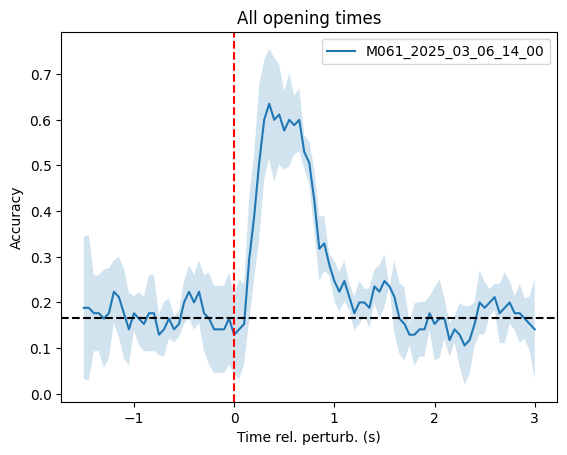

In [153]:
fig, ax = plt.subplots()
vizutils.shaded_errorbar(ax, time-2, scores, errorStat=np.std, label=handler.session)
ax.axvline(x=0, color='r', linestyle='dashed')
ax.axhline(y=1/6, color='k', linestyle='dashed')
ax.set_xlabel('Time rel. perturb. (s)')
ax.set_ylabel('Accuracy')
# ax.set_ylim(0, 0.45)
ax.legend()
ax.set_title('All opening times')
plt.show()

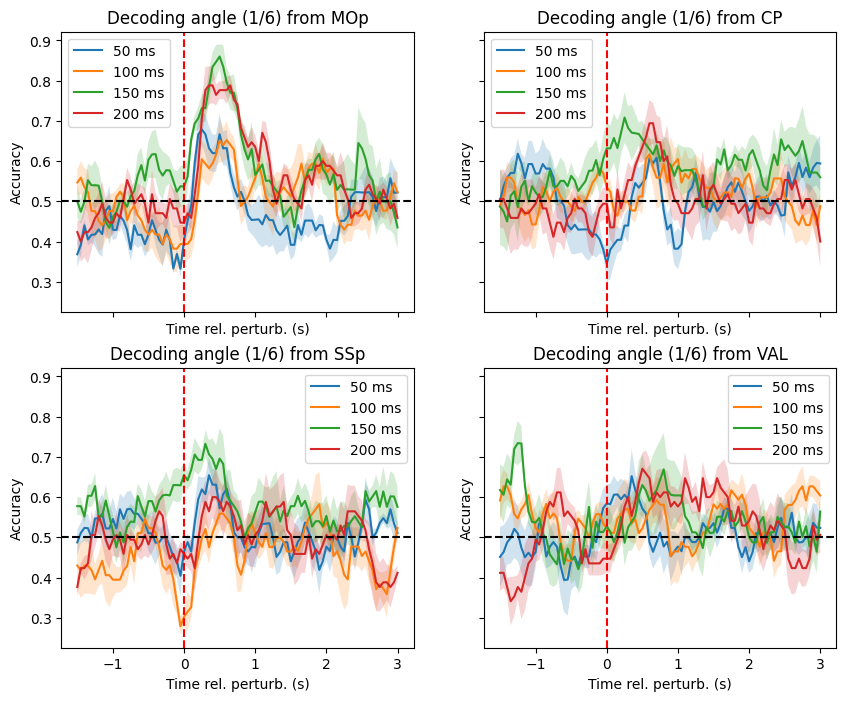

In [166]:
openings = [50, 100, 150, 200]
areas = ['MOp', 'CP', 'SSp', 'VAL']
fig, axes = plt.subplots(2, 2, figsize=(10, 8), sharex='all', sharey='all')

for area, ax in zip(areas, axes.ravel()):
    for opening in openings:

        df = handler.df.copy()
        df = pyal.select_trials(df, df.trial_name == 'trial')
        df = pyal.select_trials(df, f'values_Sol_duration == {opening}')
        df = pyal.restrict_to_interval(df, 'idx_sol_on', rel_start=-200, rel_end=300)
        model = compute_pca(np.concatenate(df[f'{area}_rates'].values), n_components=20)
        df = pyal.apply_dim_reduce_model(df, model, f'{area}_rates', 'pca')
        data = np.stack(df[f'pca'].values)
        targets = df.values_Sol_direction.values.tolist()
        targets = [Params.sol_dir_to_contra_ipse[target] for target in targets]
        scores, time = moving_window_decoding(data, targets, k=5)
        vizutils.shaded_errorbar(ax, time-2, scores, errorStat=scipy.stats.sem, label=f'{opening} ms')

    ax.axvline(x=0, color='r', linestyle='dashed')
    ax.axhline(y=1/2, color='k', linestyle='dashed')
    ax.set_xlabel('Time rel. perturb. (s)')
    ax.set_ylabel('Accuracy')
    # ax.set_ylim(0, 1)
    ax.legend()
    ax.set_title(f'Decoding angle (1/6) from {area}')

plt.show()


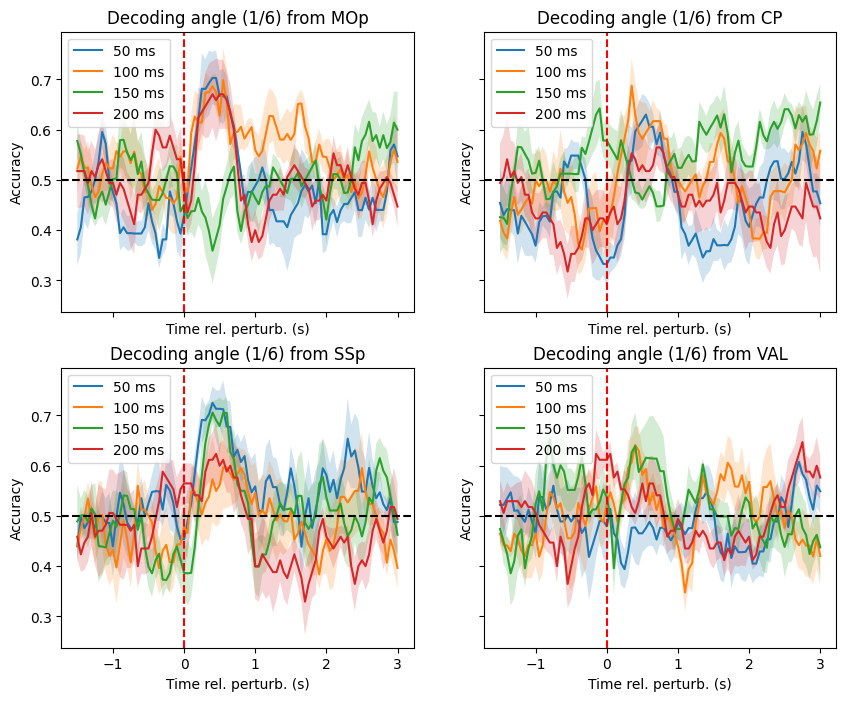

In [167]:
openings = [50, 100, 150, 200]
areas = ['MOp', 'CP', 'SSp', 'VAL']
fig, axes = plt.subplots(2, 2, figsize=(10, 8), sharex='all', sharey='all')

for area, ax in zip(areas, axes.ravel()):
    for opening in openings:

        df = handler.df.copy()
        df = pyal.select_trials(df, df.trial_name == 'trial')
        df = pyal.select_trials(df, f'values_Sol_duration == {opening}')
        df = pyal.restrict_to_interval(df, 'idx_sol_on', rel_start=-200, rel_end=300)
        model = compute_pca(np.concatenate(df[f'{area}_rates'].values), n_components=20)
        df = pyal.apply_dim_reduce_model(df, model, f'{area}_rates', 'pca')
        data = np.stack(df[f'pca'].values)
        targets = df.values_Sol_direction.values.tolist()
        targets = [Params.sol_dir_to_level[target] for target in targets]
        scores, time = moving_window_decoding(data, targets, k=5)
        vizutils.shaded_errorbar(ax, time-2, scores, errorStat=scipy.stats.sem, label=f'{opening} ms')

    ax.axvline(x=0, color='r', linestyle='dashed')
    ax.axhline(y=1/2, color='k', linestyle='dashed')
    ax.set_xlabel('Time rel. perturb. (s)')
    ax.set_ylabel('Accuracy')
    # ax.set_ylim(0, 1)
    ax.legend()
    ax.set_title(f'Decoding angle (1/6) from {area}')

plt.show()


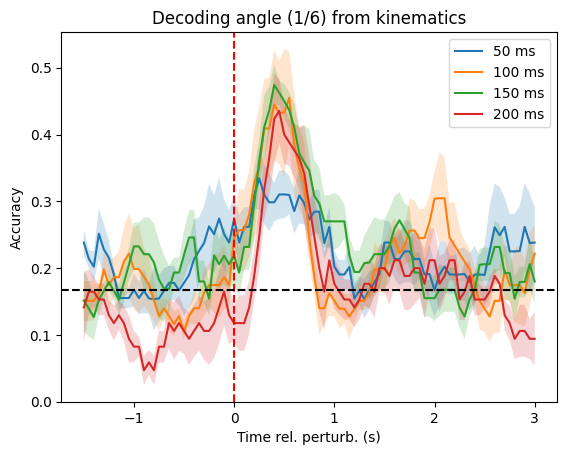

In [163]:
import scipy
openings = [50, 100, 150, 200]
fig, ax = plt.subplots(sharex='all', sharey='all')
kinematics_for_decoding = ['left_ankle', 'left_ankle_angle', 'left_elbow', 'left_elbow_angle',
       'left_foot', 'left_knee', 'left_knee_angle', 'left_paw',
       'left_shoulder', 'left_wrist', 'left_wrist_angle', 'right_ankle',
       'right_ankle_angle', 'right_elbow', 'right_elbow_angle', 'right_foot',
       'right_knee', 'right_knee_angle', 'right_paw', 'right_shoulder',
       'right_wrist', 'right_wrist_angle', 'shoulder_center', 'tail_base',
       'tail_middle', 'tail_tip']

for opening in openings:

    df = handler.df.copy()
    df = pyal.select_trials(df, df.trial_name == 'trial')
    df = pyal.select_trials(df, f'values_Sol_duration == {opening}')
    df = dt.add_bhv(df, kinematics_for_decoding)
    df = pyal.restrict_to_interval(df, 'idx_sol_on', rel_start=-200, rel_end=300)
    # model = compute_pca(np.concatenate(df[f'{area}_rates'].values), n_components=20)
    # df = pyal.apply_dim_reduce_model(df, model, f'{area}_rates', 'pca')
    data = np.stack(df[f'bhv'].values)
    targets = df.values_Sol_direction.values.tolist()
    targets = [Params.sol_dir_to_angle[target] for target in targets]
    scores, time = moving_window_decoding(data, targets, k=5)
    vizutils.shaded_errorbar(ax, time-2, scores, errorStat=scipy.stats.sem, label=f'{opening} ms')

ax.axvline(x=0, color='r', linestyle='dashed')
ax.axhline(y=1/6, color='k', linestyle='dashed')
ax.set_xlabel('Time rel. perturb. (s)')
ax.set_ylabel('Accuracy')
# ax.set_ylim(0, 1)
ax.legend()
ax.set_title(f'Decoding angle (1/6) from kinematics')

plt.show()


## Recheck last session M062

In [9]:
handler = decode.DecodingDataHandler(data_dir='/data/bnd-data/raw/', 
                                     session='M062_2025_03_21_14_00',
                                     combine_time_bins=False)

field values_before_camera_trigger could not be converted to int.
field idx_before_camera_trigger could not be converted to int.
array field VAL_KSLabel could not be converted to int.
array field SSp_KSLabel could not be converted to int.
array field all_KSLabel could not be converted to int.
array field MOp_KSLabel could not be converted to int.
array field CP_KSLabel could not be converted to int.
field values_Sol_direction could not be converted to int.
field idx_Sol_direction could not be converted to int.
field values_Sol_duration could not be converted to int.
field idx_Sol_duration could not be converted to int.
field idx_sol_on could not be converted to int.
array field VAL_KSLabel could not be converted to int.
array field SSp_KSLabel could not be converted to int.
array field all_KSLabel could not be converted to int.
array field MOp_KSLabel could not be converted to int.
array field CP_KSLabel could not be converted to int.
field values_Sol_direction could not be converted t

/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: values_MotSen1_X might be a time-varying field. It matches the length of VAL_spikes on 99.85875706214689% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: idx_MotSen1_X might be a time-varying field. It matches the length of VAL_spikes on 99.85875706214689% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: values_MotSen1_Y might be a time-varying field. It matches the length of VAL_spikes on 99.85875706214689% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/pyaldata/utils.py:155: UserWarning: idx_MotSen1_Y might be a time-varying field. It matches the length of VAL_spikes on 99.85875706214689% of trials
  warnings.warn(
/data/poetryenvs/earthquake-analysis-Z8riI-lB-py3.12/src/PyalData/

Resulting VAL_spikes ephys data shape is (NxT): (122, 48000)
Resulting SSp_spikes ephys data shape is (NxT): (66, 48000)
Resulting all_spikes ephys data shape is (NxT): (23, 48000)
Resulting MOp_spikes ephys data shape is (NxT): (179, 48000)
Resulting CP_spikes ephys data shape is (NxT): (280, 48000)


In [6]:
scores, time_points = decode_perturb_dir_from_data_or_kinematics(handler, keypoints='all')
vizutils.shaded_errorbar(ax, time_points, scores, errorStat=np.std, label=handler.session)
ax.axvline(x=0, color='r', linestyle='dashed')
ax.axhline(y=1/12, color='k', linestyle='dashed')
ax.set_xlabel('Time rel. perturb. (s)')
ax.set_ylabel('Accuracy')
ax.set_ylim(0, 0.45)
ax.legend()
ax.set_title('All kinematics')

/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:27: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [706]
  df = pyal.restrict_to_interval(df, epoch_fun=epoch)


/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:18: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [706]
  df = pyal.restrict_to_interval(df, epoch_fun=epoch)
/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:147: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [706]
  df_ = pyal.restrict_to_interval(df, epoch_fun=epoch) if epoch is not None else df


ValueError: cannot reshape array of size 0 into shape (0)

In [10]:
kin = [
        "left_ankle",
        "left_ankle_angle",
        "left_elbow",
        "left_elbow_angle",
        "left_foot",
        "left_knee",
        "left_knee_angle",
        "left_paw",
        "left_shoulder",
        "left_wrist",
        "left_wrist_angle",
        "right_ankle",
        "right_ankle_angle",
        "right_elbow",
        "right_elbow_angle",
        "right_foot",
        "right_knee",
        "right_knee_angle",
        "right_paw",
        "right_shoulder",
        "right_wrist",
        "right_wrist_angle",
        "shoulder_center",
        "tail_base",
        "tail_middle",
]
_, kinematics = handler.get_data_and_kinematics(condition='trial', kinematics=kin)

/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:27: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [706]
  df = pyal.restrict_to_interval(df, epoch_fun=epoch)
/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:18: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [706]
  df = pyal.restrict_to_interval(df, epoch_fun=epoch)
/home/me24/repos/earthquake-analysis/notebooks/pipelines/../../tools/dataTools.py:147: UserWarning: Dropping the trials with the following IDs because of invalid time indexing. For more information, try warn_per_trial=True

        [706]
  df_ = pyal.restrict_to_interval(df, epoch_fun=epoch) if epoch is not None else df


In [ ]:
len(targets)

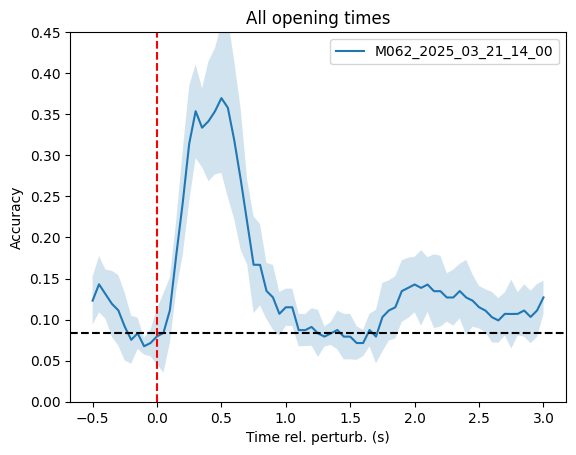

In [17]:
targets = np.repeat(np.arange(12), kinematics.shape[0]/12)
scores, times = decode.moving_window_decoding(
    kinematics,
    targets,
)
fig, ax = plt.subplots()
vizutils.shaded_errorbar(ax, times-1, scores, errorStat=np.std, label=handler.session)
ax.axvline(x=0, color='r', linestyle='dashed')
ax.axhline(y=1/12, color='k', linestyle='dashed')
ax.set_xlabel('Time rel. perturb. (s)')
ax.set_ylabel('Accuracy')
ax.set_ylim(0, 0.45)
ax.legend()
ax.set_title('All opening times')
plt.show()